# Imports

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pickle as pkl
from PIL import Image
import torch
from torch.backends import cudnn
import torch.nn.functional as F
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torch.autograd import Variable
from torchvision import transforms
from skimage import io, transform
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight
import sys

In [2]:
sys.path.append('/WorkSpace/PrivacyGAN/common/')
sys.path.append('/WorkSpace/PrivacyGAN/models/')

In [21]:
from pix2pix import define_G, define_D, GANLoss
import utility as utils

# Import Data

In [4]:
train_path, valid_path, \
    y_cls_train, y_cls_valid, \
    y_cxt_train, y_cxt_valid = pkl.load(open('../checkpoints/nico/dataset_animal.pkl', 'rb'))

# Environment Variables

In [5]:
BATCH_SIZE = 16
MULTISCALE = False
N_CPU = 8
IMAGE_DIM = 128

# Load Dataset

In [6]:
cls_encoder = LabelEncoder()
y_cls_train = cls_encoder.fit_transform(y_cls_train)
y_cls_valid = cls_encoder.transform(y_cls_valid)
cxt_encoder = LabelEncoder()
y_cxt_train = cxt_encoder.fit_transform(y_cxt_train)

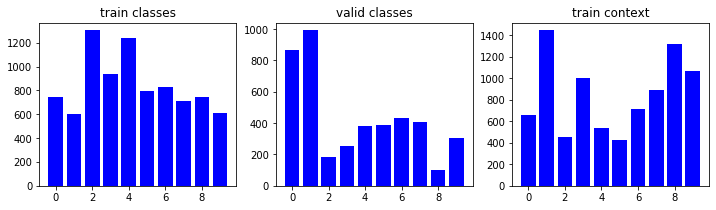

In [7]:
fig = plt.figure(figsize=(12,3))
ax1 = plt.subplot(131)
ax1.bar(np.unique(y_cls_train), np.bincount(y_cls_train), color='b')
ax1.set_title('train classes')
ax1 = plt.subplot(132)
ax1.bar(np.unique(y_cls_train), np.bincount(y_cls_valid), color='b')
ax1.set_title('valid classes')
ax1 = plt.subplot(133)
ax1.bar(np.unique(y_cxt_train), np.bincount(y_cxt_train), color='b')
ax1.set_title('train context')
plt.show()

In [8]:
w_cls = compute_class_weight('balanced', np.unique(y_cls_train), y_cls_train)
w_cxt = compute_class_weight('balanced', np.unique(y_cxt_train), y_cxt_train)

In [9]:
y_cls_train = utils.to_categorical(y_cls_train)
y_cls_valid = utils.to_categorical(y_cls_valid)
y_cxt_train = utils.to_categorical(y_cxt_train)

NUM_CLS = y_cls_train.shape[1]
NUM_CXT = y_cxt_train.shape[1]
y_cls_train.shape, y_cls_valid.shape, y_cxt_train.shape

((8511, 10), (4309, 10), (8511, 10))

In [10]:
class NICODataset(Dataset):
    def __init__(self, path, label_0, label_1, transform=None):
        assert len(path) == len(label_0) and len(path) == len(label_1)
        self.path = path
        self.label_0 = label_0
        self.label_1 = label_1
        self.transform = transform
        
    def __len__(self):
        return len(self.path)
    
    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        image_path = self.path[idx]
        image = Image.open(image_path)
        image = image.resize((IMAGE_DIM, IMAGE_DIM))
        image = np.array(image)
        sample = {
            'image': image, 
            'cls': self.label_0[idx],
            'cxt': self.label_1[idx]
        }
        
        if self.transform:
            sample = self.transform(sample)

        return sample
    
    def collate_fn(self, batch):
        imgs, cls, cxts = [], [], []
        for elem in batch:
            imgs.append(elem['image'])
            cls.append(elem['cls'])
            cxts.append(elem['cxt'])
        imgs = torch.stack(imgs)
        cls = torch.stack(cls)
        cxts = torch.stack(cxts)
        return {
            'image': imgs, 
            'cls': cls, 
            'cxt': cxts
        }
    
class ToTensor(object):
    """Convert ndarrays in sample to Tensors."""

    def __call__(self, sample):
        image, cls, cxt = sample['image'], sample['cls'], sample['cxt']
        image = image.transpose((2, 0, 1))
        return {
            'image': torch.from_numpy(image).float().div(255),
            'cls': torch.from_numpy(cls),
            'cxt': torch.from_numpy(cxt)
               }

In [11]:
train_dataset = NICODataset(train_path, y_cls_train, y_cxt_train, transform=transforms.Compose([ToTensor()]))
valid_dataset = NICODataset(valid_path, y_cls_valid, y_cls_valid, transform=transforms.Compose([ToTensor()]))

0 1357 torch.Size([3, 128, 128])
1 112 torch.Size([3, 128, 128])
2 5135 torch.Size([3, 128, 128])
3 1585 torch.Size([3, 128, 128])


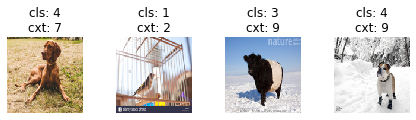

0 2602 torch.Size([3, 128, 128])
1 1701 torch.Size([3, 128, 128])
2 3366 torch.Size([3, 128, 128])
3 4101 torch.Size([3, 128, 128])


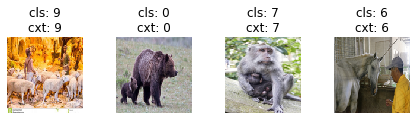

In [12]:
fig = plt.figure()

for data in [train_dataset, valid_dataset]:
    for i in range(len(data)):
        j = np.random.randint(0, len(data))
        sample = data[j]

        print(i, j, sample['image'].shape)

        ax = plt.subplot(1, 4, i + 1)
        plt.tight_layout()
        ax.set_title('cls: {}\ncxt: {}'.format(np.argmax([sample['cls'].numpy()], axis=1)[0], 
                                               np.argmax([sample['cxt'].numpy()], axis=1)[0]))
        ax.axis('off')
        plt.imshow(sample['image'].numpy().transpose(1, 2, 0))

        if i == 3:
            plt.show()
            break

In [13]:
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=1, 
                          collate_fn=train_dataset.collate_fn)
valid_loader = DataLoader(valid_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=1, 
                          collate_fn=train_dataset.collate_fn)

# Training Setup

In [14]:
from torchvision.models import resnet18 as Net
from torchsummary import torchsummary

In [15]:
use_cuda = torch.cuda.is_available()
device = torch.device("cuda:0" if use_cuda else "cpu")
cudnn.benchmark = True
use_cuda

True

In [ ]:
net_g = define_G(3, 3, 64, 'batch', False, 'normal', 0.02, gpu_id=device)
net_d = define_D(3, 64, 'basic', gpu_id=device) 

In [58]:
model_0 = Net(num_classes=NUM_CLS).to(device)
model_1 = Net(num_classes=NUM_CXT).to(device)

In [59]:
optimizer_g = torch.optim.Adam(net_g.parameters(), lr=0.0001)
optimizer_d = torch.optim.Adam(net_d.parameters(), lr=0.0001)
optimizer_0 = torch.optim.Adam(model_0.parameters(), lr=0.0001)
optimizer_1 = torch.optim.Adam(model_1.parameters(), lr=0.0001)

In [19]:
net_d.apply(utils.weights_init_normal)
model_0.apply(utils.weights_init_normal)
model_1.apply(utils.weights_init_normal)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [20]:
clsBCE = torch.nn.BCEWithLogitsLoss(pos_weight=torch.Tensor(w_cls)).to(device)
cxtBCE = torch.nn.BCEWithLogitsLoss(pos_weight=torch.Tensor(w_cxt)).to(device)
_BCE = torch.nn.BCEWithLogitsLoss().to(device)

In [22]:
criterionGAN = GANLoss().to(device)
criterionL1 = nn.L1Loss().to(device)
criterionMSE = nn.MSELoss().to(device)

# Pretrain

===> Epoch[0](1/532): Loss_D: 0.7862 Loss_G: 7.1209
===> Epoch[0](2/532): Loss_D: 0.3141 Loss_G: 7.1963
===> Epoch[0](3/532): Loss_D: 0.2454 Loss_G: 7.4617
===> Epoch[0](4/532): Loss_D: 0.1859 Loss_G: 6.7525
===> Epoch[0](5/532): Loss_D: 0.1488 Loss_G: 7.2259
===> Epoch[0](6/532): Loss_D: 0.0949 Loss_G: 7.0828
===> Epoch[0](7/532): Loss_D: 0.0925 Loss_G: 7.0215
===> Epoch[0](8/532): Loss_D: 0.0753 Loss_G: 6.7734
===> Epoch[0](9/532): Loss_D: 0.0526 Loss_G: 7.1851
===> Epoch[0](10/532): Loss_D: 0.0450 Loss_G: 7.5085
===> Epoch[0](11/532): Loss_D: 0.0387 Loss_G: 7.6198
===> Epoch[0](12/532): Loss_D: 0.0403 Loss_G: 7.4688
===> Epoch[0](13/532): Loss_D: 0.0301 Loss_G: 7.3129
===> Epoch[0](14/532): Loss_D: 0.0221 Loss_G: 7.2412
===> Epoch[0](15/532): Loss_D: 0.0241 Loss_G: 7.5052
===> Epoch[0](16/532): Loss_D: 0.0294 Loss_G: 6.8170
===> Epoch[0](17/532): Loss_D: 0.0320 Loss_G: 7.5323
===> Epoch[0](18/532): Loss_D: 0.0267 Loss_G: 7.2243
===> Epoch[0](19/532): Loss_D: 0.0160 Loss_G: 7.9126
==

===> Epoch[0](156/532): Loss_D: 0.1908 Loss_G: 2.2954
===> Epoch[0](157/532): Loss_D: 0.2515 Loss_G: 1.8138
===> Epoch[0](158/532): Loss_D: 0.1868 Loss_G: 2.1375
===> Epoch[0](159/532): Loss_D: 0.2881 Loss_G: 2.1395
===> Epoch[0](160/532): Loss_D: 0.2166 Loss_G: 1.9694
===> Epoch[0](161/532): Loss_D: 0.2111 Loss_G: 1.9288
===> Epoch[0](162/532): Loss_D: 0.2137 Loss_G: 1.8185
===> Epoch[0](163/532): Loss_D: 0.1588 Loss_G: 2.0612
===> Epoch[0](164/532): Loss_D: 0.1467 Loss_G: 1.9643
===> Epoch[0](165/532): Loss_D: 0.1182 Loss_G: 2.2647
===> Epoch[0](166/532): Loss_D: 0.1388 Loss_G: 2.0529
===> Epoch[0](167/532): Loss_D: 0.0941 Loss_G: 2.0751
===> Epoch[0](168/532): Loss_D: 0.0732 Loss_G: 2.1978
===> Epoch[0](169/532): Loss_D: 0.0873 Loss_G: 2.0608
===> Epoch[0](170/532): Loss_D: 0.0618 Loss_G: 2.1892
===> Epoch[0](171/532): Loss_D: 0.0616 Loss_G: 2.1668
===> Epoch[0](172/532): Loss_D: 0.0703 Loss_G: 2.2487
===> Epoch[0](173/532): Loss_D: 0.0716 Loss_G: 2.2336
===> Epoch[0](174/532): Loss

===> Epoch[0](308/532): Loss_D: 0.0921 Loss_G: 2.9637
===> Epoch[0](309/532): Loss_D: 0.0972 Loss_G: 3.0402
===> Epoch[0](310/532): Loss_D: 0.1860 Loss_G: 2.7933
===> Epoch[0](311/532): Loss_D: 0.0754 Loss_G: 2.4690
===> Epoch[0](312/532): Loss_D: 0.0963 Loss_G: 2.3447
===> Epoch[0](313/532): Loss_D: 0.1288 Loss_G: 2.2612
===> Epoch[0](314/532): Loss_D: 0.0856 Loss_G: 2.5274
===> Epoch[0](315/532): Loss_D: 0.0814 Loss_G: 2.6675
===> Epoch[0](316/532): Loss_D: 0.1010 Loss_G: 2.5487
===> Epoch[0](317/532): Loss_D: 0.1286 Loss_G: 2.1849
===> Epoch[0](318/532): Loss_D: 0.1252 Loss_G: 2.0535
===> Epoch[0](319/532): Loss_D: 0.1507 Loss_G: 1.9830
===> Epoch[0](320/532): Loss_D: 0.1348 Loss_G: 2.5933
===> Epoch[0](321/532): Loss_D: 0.1467 Loss_G: 2.2520
===> Epoch[0](322/532): Loss_D: 0.2523 Loss_G: 2.1360
===> Epoch[0](323/532): Loss_D: 0.1511 Loss_G: 2.1369
===> Epoch[0](324/532): Loss_D: 0.2455 Loss_G: 1.9436
===> Epoch[0](325/532): Loss_D: 0.1803 Loss_G: 1.8560
===> Epoch[0](326/532): Loss

===> Epoch[0](460/532): Loss_D: 0.1812 Loss_G: 2.2692
===> Epoch[0](461/532): Loss_D: 0.1112 Loss_G: 2.6620
===> Epoch[0](462/532): Loss_D: 0.2940 Loss_G: 2.3503
===> Epoch[0](463/532): Loss_D: 0.2104 Loss_G: 2.1009
===> Epoch[0](464/532): Loss_D: 0.2294 Loss_G: 1.8986
===> Epoch[0](465/532): Loss_D: 0.3334 Loss_G: 1.7696
===> Epoch[0](466/532): Loss_D: 0.2510 Loss_G: 2.2046
===> Epoch[0](467/532): Loss_D: 0.2469 Loss_G: 2.2368
===> Epoch[0](468/532): Loss_D: 0.2919 Loss_G: 2.4840
===> Epoch[0](469/532): Loss_D: 0.2507 Loss_G: 2.7188
===> Epoch[0](470/532): Loss_D: 0.2472 Loss_G: 2.0879
===> Epoch[0](471/532): Loss_D: 0.2164 Loss_G: 2.2315
===> Epoch[0](472/532): Loss_D: 0.1675 Loss_G: 2.4547
===> Epoch[0](473/532): Loss_D: 0.2168 Loss_G: 2.3918
===> Epoch[0](474/532): Loss_D: 0.1387 Loss_G: 2.5072
===> Epoch[0](475/532): Loss_D: 0.1415 Loss_G: 2.6584
===> Epoch[0](476/532): Loss_D: 0.1401 Loss_G: 2.2665
===> Epoch[0](477/532): Loss_D: 0.1303 Loss_G: 2.5542
===> Epoch[0](478/532): Loss

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0 3466 torch.Size([3, 128, 128])
1 493 torch.Size([3, 128, 128])
2 131 torch.Size([3, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3 1412 torch.Size([3, 128, 128])


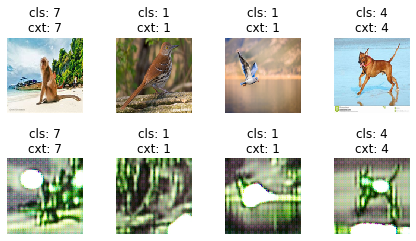

===> Epoch[1](1/532): Loss_D: 0.1775 Loss_G: 1.4491
===> Epoch[1](2/532): Loss_D: 0.1768 Loss_G: 1.6063
===> Epoch[1](3/532): Loss_D: 0.1348 Loss_G: 1.9053
===> Epoch[1](4/532): Loss_D: 0.1133 Loss_G: 1.9939
===> Epoch[1](5/532): Loss_D: 0.1181 Loss_G: 1.9304
===> Epoch[1](6/532): Loss_D: 0.1310 Loss_G: 1.9212
===> Epoch[1](7/532): Loss_D: 0.0984 Loss_G: 2.0095
===> Epoch[1](8/532): Loss_D: 0.1068 Loss_G: 1.9310
===> Epoch[1](9/532): Loss_D: 0.1069 Loss_G: 1.8032
===> Epoch[1](10/532): Loss_D: 0.1231 Loss_G: 1.8930
===> Epoch[1](11/532): Loss_D: 0.0854 Loss_G: 1.9966
===> Epoch[1](12/532): Loss_D: 0.0737 Loss_G: 2.2965
===> Epoch[1](13/532): Loss_D: 0.1071 Loss_G: 2.1944
===> Epoch[1](14/532): Loss_D: 0.0419 Loss_G: 2.0747
===> Epoch[1](15/532): Loss_D: 0.0616 Loss_G: 2.0855
===> Epoch[1](16/532): Loss_D: 0.0716 Loss_G: 2.0518
===> Epoch[1](17/532): Loss_D: 0.0642 Loss_G: 1.9711
===> Epoch[1](18/532): Loss_D: 0.0573 Loss_G: 2.0406
===> Epoch[1](19/532): Loss_D: 0.0424 Loss_G: 2.2547
==

===> Epoch[1](155/532): Loss_D: 0.1556 Loss_G: 1.8586
===> Epoch[1](156/532): Loss_D: 0.1470 Loss_G: 2.0093
===> Epoch[1](157/532): Loss_D: 0.1688 Loss_G: 2.1895
===> Epoch[1](158/532): Loss_D: 0.1527 Loss_G: 1.9406
===> Epoch[1](159/532): Loss_D: 0.1224 Loss_G: 1.8907
===> Epoch[1](160/532): Loss_D: 0.1320 Loss_G: 1.8417
===> Epoch[1](161/532): Loss_D: 0.1559 Loss_G: 1.7702
===> Epoch[1](162/532): Loss_D: 0.1569 Loss_G: 1.8332
===> Epoch[1](163/532): Loss_D: 0.1622 Loss_G: 2.2945
===> Epoch[1](164/532): Loss_D: 0.1399 Loss_G: 2.3857
===> Epoch[1](165/532): Loss_D: 0.1524 Loss_G: 2.3629
===> Epoch[1](166/532): Loss_D: 0.1219 Loss_G: 2.1148
===> Epoch[1](167/532): Loss_D: 0.1716 Loss_G: 1.8615
===> Epoch[1](168/532): Loss_D: 0.1277 Loss_G: 2.2616
===> Epoch[1](169/532): Loss_D: 0.1364 Loss_G: 2.3560
===> Epoch[1](170/532): Loss_D: 0.1071 Loss_G: 2.0097
===> Epoch[1](171/532): Loss_D: 0.0921 Loss_G: 2.4209
===> Epoch[1](172/532): Loss_D: 0.1461 Loss_G: 2.3889
===> Epoch[1](173/532): Loss

===> Epoch[1](307/532): Loss_D: 0.1359 Loss_G: 1.7149
===> Epoch[1](308/532): Loss_D: 0.1717 Loss_G: 1.7418
===> Epoch[1](309/532): Loss_D: 0.1659 Loss_G: 1.7384
===> Epoch[1](310/532): Loss_D: 0.1515 Loss_G: 1.8957
===> Epoch[1](311/532): Loss_D: 0.2384 Loss_G: 1.6151
===> Epoch[1](312/532): Loss_D: 0.1910 Loss_G: 1.7376
===> Epoch[1](313/532): Loss_D: 0.1488 Loss_G: 1.7173
===> Epoch[1](314/532): Loss_D: 0.1951 Loss_G: 1.8321
===> Epoch[1](315/532): Loss_D: 0.2208 Loss_G: 1.5505
===> Epoch[1](316/532): Loss_D: 0.2389 Loss_G: 1.5082
===> Epoch[1](317/532): Loss_D: 0.2211 Loss_G: 1.5311
===> Epoch[1](318/532): Loss_D: 0.1626 Loss_G: 1.7922
===> Epoch[1](319/532): Loss_D: 0.1817 Loss_G: 1.7486
===> Epoch[1](320/532): Loss_D: 0.2583 Loss_G: 1.6579
===> Epoch[1](321/532): Loss_D: 0.2310 Loss_G: 1.4564
===> Epoch[1](322/532): Loss_D: 0.2329 Loss_G: 1.7521
===> Epoch[1](323/532): Loss_D: 0.1604 Loss_G: 1.8479
===> Epoch[1](324/532): Loss_D: 0.1272 Loss_G: 1.9697
===> Epoch[1](325/532): Loss

===> Epoch[1](459/532): Loss_D: 0.1656 Loss_G: 1.8141
===> Epoch[1](460/532): Loss_D: 0.1710 Loss_G: 1.9509
===> Epoch[1](461/532): Loss_D: 0.1902 Loss_G: 1.7363
===> Epoch[1](462/532): Loss_D: 0.1625 Loss_G: 1.6964
===> Epoch[1](463/532): Loss_D: 0.1515 Loss_G: 1.9187
===> Epoch[1](464/532): Loss_D: 0.1503 Loss_G: 2.0589
===> Epoch[1](465/532): Loss_D: 0.2113 Loss_G: 1.8848
===> Epoch[1](466/532): Loss_D: 0.1659 Loss_G: 1.7099
===> Epoch[1](467/532): Loss_D: 0.1262 Loss_G: 1.6331
===> Epoch[1](468/532): Loss_D: 0.1728 Loss_G: 1.6402
===> Epoch[1](469/532): Loss_D: 0.1849 Loss_G: 1.7786
===> Epoch[1](470/532): Loss_D: 0.2007 Loss_G: 1.8262
===> Epoch[1](471/532): Loss_D: 0.1487 Loss_G: 2.0362
===> Epoch[1](472/532): Loss_D: 0.1784 Loss_G: 1.8315
===> Epoch[1](473/532): Loss_D: 0.1595 Loss_G: 1.7525
===> Epoch[1](474/532): Loss_D: 0.1433 Loss_G: 1.7160
===> Epoch[1](475/532): Loss_D: 0.1767 Loss_G: 1.5761
===> Epoch[1](476/532): Loss_D: 0.1293 Loss_G: 1.9698
===> Epoch[1](477/532): Loss

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0 2051 torch.Size([3, 128, 128])
1 3681 torch.Size([3, 128, 128])
2 363 torch.Size([3, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3 1908 torch.Size([3, 128, 128])


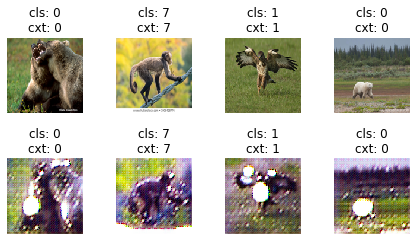

===> Epoch[2](1/532): Loss_D: 0.1863 Loss_G: 1.7423
===> Epoch[2](2/532): Loss_D: 0.1820 Loss_G: 1.9075
===> Epoch[2](3/532): Loss_D: 0.1403 Loss_G: 2.1114
===> Epoch[2](4/532): Loss_D: 0.1864 Loss_G: 1.8785
===> Epoch[2](5/532): Loss_D: 0.1772 Loss_G: 1.8014
===> Epoch[2](6/532): Loss_D: 0.1852 Loss_G: 1.6673
===> Epoch[2](7/532): Loss_D: 0.2079 Loss_G: 1.6894
===> Epoch[2](8/532): Loss_D: 0.1741 Loss_G: 2.0233
===> Epoch[2](9/532): Loss_D: 0.1166 Loss_G: 1.9920
===> Epoch[2](10/532): Loss_D: 0.1552 Loss_G: 2.0511
===> Epoch[2](11/532): Loss_D: 0.1370 Loss_G: 1.8343
===> Epoch[2](12/532): Loss_D: 0.1124 Loss_G: 1.7677
===> Epoch[2](13/532): Loss_D: 0.1434 Loss_G: 1.8102
===> Epoch[2](14/532): Loss_D: 0.1311 Loss_G: 2.0159
===> Epoch[2](15/532): Loss_D: 0.0997 Loss_G: 2.0373
===> Epoch[2](16/532): Loss_D: 0.1318 Loss_G: 1.7787
===> Epoch[2](17/532): Loss_D: 0.1868 Loss_G: 1.8777
===> Epoch[2](18/532): Loss_D: 0.1656 Loss_G: 2.0767
===> Epoch[2](19/532): Loss_D: 0.1935 Loss_G: 1.8241
==

===> Epoch[2](155/532): Loss_D: 0.2594 Loss_G: 1.5608
===> Epoch[2](156/532): Loss_D: 0.1490 Loss_G: 1.5922
===> Epoch[2](157/532): Loss_D: 0.1994 Loss_G: 1.3836
===> Epoch[2](158/532): Loss_D: 0.2221 Loss_G: 1.5114
===> Epoch[2](159/532): Loss_D: 0.1530 Loss_G: 1.7115
===> Epoch[2](160/532): Loss_D: 0.1110 Loss_G: 1.8422
===> Epoch[2](161/532): Loss_D: 0.1379 Loss_G: 1.7325
===> Epoch[2](162/532): Loss_D: 0.1297 Loss_G: 1.6237
===> Epoch[2](163/532): Loss_D: 0.1233 Loss_G: 1.7749
===> Epoch[2](164/532): Loss_D: 0.1071 Loss_G: 1.6164
===> Epoch[2](165/532): Loss_D: 0.1247 Loss_G: 1.5161
===> Epoch[2](166/532): Loss_D: 0.1009 Loss_G: 1.6860
===> Epoch[2](167/532): Loss_D: 0.1216 Loss_G: 1.6360
===> Epoch[2](168/532): Loss_D: 0.1084 Loss_G: 1.6431
===> Epoch[2](169/532): Loss_D: 0.1437 Loss_G: 1.6260
===> Epoch[2](170/532): Loss_D: 0.1832 Loss_G: 1.4316
===> Epoch[2](171/532): Loss_D: 0.1434 Loss_G: 1.3699
===> Epoch[2](172/532): Loss_D: 0.1327 Loss_G: 1.4826
===> Epoch[2](173/532): Loss

===> Epoch[2](307/532): Loss_D: 0.1637 Loss_G: 1.3905
===> Epoch[2](308/532): Loss_D: 0.1680 Loss_G: 1.4476
===> Epoch[2](309/532): Loss_D: 0.1358 Loss_G: 1.6643
===> Epoch[2](310/532): Loss_D: 0.1948 Loss_G: 1.4855
===> Epoch[2](311/532): Loss_D: 0.2048 Loss_G: 1.4088
===> Epoch[2](312/532): Loss_D: 0.1599 Loss_G: 1.2825
===> Epoch[2](313/532): Loss_D: 0.2253 Loss_G: 1.3563
===> Epoch[2](314/532): Loss_D: 0.1864 Loss_G: 1.6347
===> Epoch[2](315/532): Loss_D: 0.1681 Loss_G: 1.9223
===> Epoch[2](316/532): Loss_D: 0.2009 Loss_G: 1.6207
===> Epoch[2](317/532): Loss_D: 0.2570 Loss_G: 1.4985
===> Epoch[2](318/532): Loss_D: 0.1918 Loss_G: 1.2950
===> Epoch[2](319/532): Loss_D: 0.2264 Loss_G: 1.4923
===> Epoch[2](320/532): Loss_D: 0.2459 Loss_G: 1.4748
===> Epoch[2](321/532): Loss_D: 0.1466 Loss_G: 1.8714
===> Epoch[2](322/532): Loss_D: 0.1501 Loss_G: 1.9160
===> Epoch[2](323/532): Loss_D: 0.2575 Loss_G: 1.7842
===> Epoch[2](324/532): Loss_D: 0.2152 Loss_G: 1.5592
===> Epoch[2](325/532): Loss

===> Epoch[2](459/532): Loss_D: 0.2679 Loss_G: 1.1641
===> Epoch[2](460/532): Loss_D: 0.3349 Loss_G: 1.1523
===> Epoch[2](461/532): Loss_D: 0.3278 Loss_G: 1.0274
===> Epoch[2](462/532): Loss_D: 0.3041 Loss_G: 1.2815
===> Epoch[2](463/532): Loss_D: 0.3034 Loss_G: 1.1184
===> Epoch[2](464/532): Loss_D: 0.2977 Loss_G: 1.1018
===> Epoch[2](465/532): Loss_D: 0.2693 Loss_G: 1.3393
===> Epoch[2](466/532): Loss_D: 0.2986 Loss_G: 1.1947
===> Epoch[2](467/532): Loss_D: 0.2748 Loss_G: 1.2039
===> Epoch[2](468/532): Loss_D: 0.2558 Loss_G: 1.1107
===> Epoch[2](469/532): Loss_D: 0.2292 Loss_G: 1.1107
===> Epoch[2](470/532): Loss_D: 0.2351 Loss_G: 1.1523
===> Epoch[2](471/532): Loss_D: 0.2713 Loss_G: 1.2397
===> Epoch[2](472/532): Loss_D: 0.2441 Loss_G: 1.0976
===> Epoch[2](473/532): Loss_D: 0.2760 Loss_G: 1.1873
===> Epoch[2](474/532): Loss_D: 0.2592 Loss_G: 1.2503
===> Epoch[2](475/532): Loss_D: 0.2622 Loss_G: 1.2397
===> Epoch[2](476/532): Loss_D: 0.2665 Loss_G: 1.2851
===> Epoch[2](477/532): Loss

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0 3582 torch.Size([3, 128, 128])
1 3687 torch.Size([3, 128, 128])
2 3382 torch.Size([3, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3 3997 torch.Size([3, 128, 128])


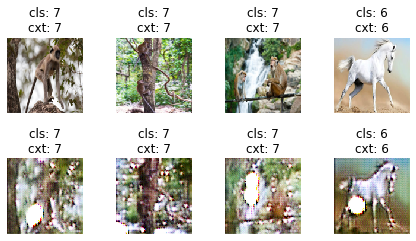

===> Epoch[3](1/532): Loss_D: 0.3008 Loss_G: 1.0531
===> Epoch[3](2/532): Loss_D: 0.2560 Loss_G: 1.1914
===> Epoch[3](3/532): Loss_D: 0.2651 Loss_G: 1.3709
===> Epoch[3](4/532): Loss_D: 0.2421 Loss_G: 1.3496
===> Epoch[3](5/532): Loss_D: 0.2649 Loss_G: 1.1680
===> Epoch[3](6/532): Loss_D: 0.2763 Loss_G: 1.1690
===> Epoch[3](7/532): Loss_D: 0.2390 Loss_G: 1.1960
===> Epoch[3](8/532): Loss_D: 0.2296 Loss_G: 1.2630
===> Epoch[3](9/532): Loss_D: 0.2314 Loss_G: 1.1578
===> Epoch[3](10/532): Loss_D: 0.2376 Loss_G: 1.2991
===> Epoch[3](11/532): Loss_D: 0.2413 Loss_G: 1.1034
===> Epoch[3](12/532): Loss_D: 0.2381 Loss_G: 1.3239
===> Epoch[3](13/532): Loss_D: 0.2314 Loss_G: 1.1943
===> Epoch[3](14/532): Loss_D: 0.2407 Loss_G: 1.2663
===> Epoch[3](15/532): Loss_D: 0.2301 Loss_G: 1.0846
===> Epoch[3](16/532): Loss_D: 0.2299 Loss_G: 1.0942
===> Epoch[3](17/532): Loss_D: 0.2417 Loss_G: 1.2045
===> Epoch[3](18/532): Loss_D: 0.1985 Loss_G: 1.2908
===> Epoch[3](19/532): Loss_D: 0.2151 Loss_G: 1.2771
==

===> Epoch[3](155/532): Loss_D: 0.1667 Loss_G: 1.3199
===> Epoch[3](156/532): Loss_D: 0.1721 Loss_G: 1.2721
===> Epoch[3](157/532): Loss_D: 0.1817 Loss_G: 1.3113
===> Epoch[3](158/532): Loss_D: 0.1625 Loss_G: 1.2935
===> Epoch[3](159/532): Loss_D: 0.2126 Loss_G: 1.3215
===> Epoch[3](160/532): Loss_D: 0.2039 Loss_G: 1.4665
===> Epoch[3](161/532): Loss_D: 0.2391 Loss_G: 1.2361
===> Epoch[3](162/532): Loss_D: 0.2735 Loss_G: 1.2458
===> Epoch[3](163/532): Loss_D: 0.2391 Loss_G: 1.0875
===> Epoch[3](164/532): Loss_D: 0.3162 Loss_G: 1.3935
===> Epoch[3](165/532): Loss_D: 0.2349 Loss_G: 1.2939
===> Epoch[3](166/532): Loss_D: 0.1984 Loss_G: 1.3695
===> Epoch[3](167/532): Loss_D: 0.2506 Loss_G: 1.2412
===> Epoch[3](168/532): Loss_D: 0.1649 Loss_G: 1.3403
===> Epoch[3](169/532): Loss_D: 0.2135 Loss_G: 1.3361
===> Epoch[3](170/532): Loss_D: 0.2620 Loss_G: 1.2995
===> Epoch[3](171/532): Loss_D: 0.1932 Loss_G: 1.4905
===> Epoch[3](172/532): Loss_D: 0.2595 Loss_G: 1.2925
===> Epoch[3](173/532): Loss

===> Epoch[3](307/532): Loss_D: 0.3096 Loss_G: 1.1950
===> Epoch[3](308/532): Loss_D: 0.2859 Loss_G: 1.2715
===> Epoch[3](309/532): Loss_D: 0.3187 Loss_G: 1.2231
===> Epoch[3](310/532): Loss_D: 0.2824 Loss_G: 1.0440
===> Epoch[3](311/532): Loss_D: 0.2719 Loss_G: 1.1142
===> Epoch[3](312/532): Loss_D: 0.2944 Loss_G: 1.1041
===> Epoch[3](313/532): Loss_D: 0.2695 Loss_G: 1.2260
===> Epoch[3](314/532): Loss_D: 0.2331 Loss_G: 1.4251
===> Epoch[3](315/532): Loss_D: 0.3411 Loss_G: 0.9607
===> Epoch[3](316/532): Loss_D: 0.2616 Loss_G: 1.0602
===> Epoch[3](317/532): Loss_D: 0.2952 Loss_G: 0.9443
===> Epoch[3](318/532): Loss_D: 0.2695 Loss_G: 1.2269
===> Epoch[3](319/532): Loss_D: 0.2238 Loss_G: 1.3918
===> Epoch[3](320/532): Loss_D: 0.2522 Loss_G: 1.1884
===> Epoch[3](321/532): Loss_D: 0.2098 Loss_G: 1.0958
===> Epoch[3](322/532): Loss_D: 0.2224 Loss_G: 1.1960
===> Epoch[3](323/532): Loss_D: 0.2316 Loss_G: 1.0052
===> Epoch[3](324/532): Loss_D: 0.2113 Loss_G: 1.0645
===> Epoch[3](325/532): Loss

===> Epoch[3](459/532): Loss_D: 0.2100 Loss_G: 1.2281
===> Epoch[3](460/532): Loss_D: 0.1784 Loss_G: 1.0875
===> Epoch[3](461/532): Loss_D: 0.1707 Loss_G: 0.9907
===> Epoch[3](462/532): Loss_D: 0.1608 Loss_G: 1.2296
===> Epoch[3](463/532): Loss_D: 0.1911 Loss_G: 1.1400
===> Epoch[3](464/532): Loss_D: 0.1637 Loss_G: 1.1672
===> Epoch[3](465/532): Loss_D: 0.1705 Loss_G: 1.1233
===> Epoch[3](466/532): Loss_D: 0.1932 Loss_G: 1.0679
===> Epoch[3](467/532): Loss_D: 0.1495 Loss_G: 1.2350
===> Epoch[3](468/532): Loss_D: 0.1666 Loss_G: 1.1526
===> Epoch[3](469/532): Loss_D: 0.1884 Loss_G: 1.2391
===> Epoch[3](470/532): Loss_D: 0.1722 Loss_G: 1.2019
===> Epoch[3](471/532): Loss_D: 0.1636 Loss_G: 1.1868
===> Epoch[3](472/532): Loss_D: 0.1749 Loss_G: 1.0831
===> Epoch[3](473/532): Loss_D: 0.1674 Loss_G: 1.2966
===> Epoch[3](474/532): Loss_D: 0.1917 Loss_G: 1.3276
===> Epoch[3](475/532): Loss_D: 0.2024 Loss_G: 1.2358
===> Epoch[3](476/532): Loss_D: 0.1669 Loss_G: 1.2693
===> Epoch[3](477/532): Loss

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0 445 torch.Size([3, 128, 128])
1 39 torch.Size([3, 128, 128])
2 2072 torch.Size([3, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3 765 torch.Size([3, 128, 128])


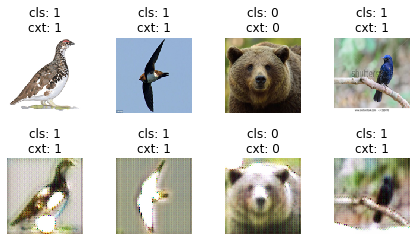

===> Epoch[4](1/532): Loss_D: 0.2443 Loss_G: 1.6087
===> Epoch[4](2/532): Loss_D: 0.1614 Loss_G: 1.2840
===> Epoch[4](3/532): Loss_D: 0.1513 Loss_G: 1.0994
===> Epoch[4](4/532): Loss_D: 0.2330 Loss_G: 1.0957
===> Epoch[4](5/532): Loss_D: 0.1509 Loss_G: 1.4579
===> Epoch[4](6/532): Loss_D: 0.1623 Loss_G: 1.5854
===> Epoch[4](7/532): Loss_D: 0.1446 Loss_G: 1.6500
===> Epoch[4](8/532): Loss_D: 0.2404 Loss_G: 1.2459
===> Epoch[4](9/532): Loss_D: 0.2009 Loss_G: 1.0808
===> Epoch[4](10/532): Loss_D: 0.1808 Loss_G: 1.3489
===> Epoch[4](11/532): Loss_D: 0.2132 Loss_G: 1.3889
===> Epoch[4](12/532): Loss_D: 0.1378 Loss_G: 1.7632
===> Epoch[4](13/532): Loss_D: 0.1594 Loss_G: 1.6647
===> Epoch[4](14/532): Loss_D: 0.2463 Loss_G: 1.5082
===> Epoch[4](15/532): Loss_D: 0.1355 Loss_G: 1.3084
===> Epoch[4](16/532): Loss_D: 0.1764 Loss_G: 1.1960
===> Epoch[4](17/532): Loss_D: 0.2494 Loss_G: 1.1952
===> Epoch[4](18/532): Loss_D: 0.2416 Loss_G: 1.3172
===> Epoch[4](19/532): Loss_D: 0.3175 Loss_G: 1.4672
==

===> Epoch[4](155/532): Loss_D: 0.1755 Loss_G: 1.2061
===> Epoch[4](156/532): Loss_D: 0.1941 Loss_G: 1.1646
===> Epoch[4](157/532): Loss_D: 0.1872 Loss_G: 1.1444
===> Epoch[4](158/532): Loss_D: 0.1869 Loss_G: 1.1633
===> Epoch[4](159/532): Loss_D: 0.1562 Loss_G: 1.2111
===> Epoch[4](160/532): Loss_D: 0.1924 Loss_G: 1.1688
===> Epoch[4](161/532): Loss_D: 0.1951 Loss_G: 1.2148
===> Epoch[4](162/532): Loss_D: 0.1916 Loss_G: 1.2177
===> Epoch[4](163/532): Loss_D: 0.2097 Loss_G: 1.0689
===> Epoch[4](164/532): Loss_D: 0.1869 Loss_G: 1.0877
===> Epoch[4](165/532): Loss_D: 0.1892 Loss_G: 1.1412
===> Epoch[4](166/532): Loss_D: 0.2178 Loss_G: 1.0150
===> Epoch[4](167/532): Loss_D: 0.2258 Loss_G: 1.1064
===> Epoch[4](168/532): Loss_D: 0.2188 Loss_G: 1.1881
===> Epoch[4](169/532): Loss_D: 0.1949 Loss_G: 1.1889
===> Epoch[4](170/532): Loss_D: 0.1972 Loss_G: 1.0962
===> Epoch[4](171/532): Loss_D: 0.2581 Loss_G: 1.1908
===> Epoch[4](172/532): Loss_D: 0.2383 Loss_G: 1.0396
===> Epoch[4](173/532): Loss

===> Epoch[4](307/532): Loss_D: 0.1588 Loss_G: 1.4009
===> Epoch[4](308/532): Loss_D: 0.2135 Loss_G: 1.1624
===> Epoch[4](309/532): Loss_D: 0.2308 Loss_G: 0.9950
===> Epoch[4](310/532): Loss_D: 0.2338 Loss_G: 1.1393
===> Epoch[4](311/532): Loss_D: 0.2426 Loss_G: 1.3463
===> Epoch[4](312/532): Loss_D: 0.2977 Loss_G: 1.3202
===> Epoch[4](313/532): Loss_D: 0.2472 Loss_G: 1.1785
===> Epoch[4](314/532): Loss_D: 0.2280 Loss_G: 1.1826
===> Epoch[4](315/532): Loss_D: 0.3163 Loss_G: 1.0939
===> Epoch[4](316/532): Loss_D: 0.3173 Loss_G: 1.0532
===> Epoch[4](317/532): Loss_D: 0.2846 Loss_G: 1.1609
===> Epoch[4](318/532): Loss_D: 0.3222 Loss_G: 1.2411
===> Epoch[4](319/532): Loss_D: 0.3057 Loss_G: 1.2810
===> Epoch[4](320/532): Loss_D: 0.3468 Loss_G: 1.1805
===> Epoch[4](321/532): Loss_D: 0.3591 Loss_G: 0.9807
===> Epoch[4](322/532): Loss_D: 0.4181 Loss_G: 1.0796
===> Epoch[4](323/532): Loss_D: 0.3309 Loss_G: 1.2368
===> Epoch[4](324/532): Loss_D: 0.3809 Loss_G: 1.1488
===> Epoch[4](325/532): Loss

===> Epoch[4](459/532): Loss_D: 0.2091 Loss_G: 0.9096
===> Epoch[4](460/532): Loss_D: 0.2061 Loss_G: 0.9695
===> Epoch[4](461/532): Loss_D: 0.1943 Loss_G: 0.9416
===> Epoch[4](462/532): Loss_D: 0.1942 Loss_G: 1.0596
===> Epoch[4](463/532): Loss_D: 0.2100 Loss_G: 1.2080
===> Epoch[4](464/532): Loss_D: 0.1890 Loss_G: 1.1980
===> Epoch[4](465/532): Loss_D: 0.2589 Loss_G: 1.0162
===> Epoch[4](466/532): Loss_D: 0.2223 Loss_G: 1.0082
===> Epoch[4](467/532): Loss_D: 0.2201 Loss_G: 0.9276
===> Epoch[4](468/532): Loss_D: 0.2493 Loss_G: 0.8739
===> Epoch[4](469/532): Loss_D: 0.2401 Loss_G: 1.0802
===> Epoch[4](470/532): Loss_D: 0.2378 Loss_G: 1.0868
===> Epoch[4](471/532): Loss_D: 0.2404 Loss_G: 1.1081
===> Epoch[4](472/532): Loss_D: 0.2923 Loss_G: 1.1486
===> Epoch[4](473/532): Loss_D: 0.2565 Loss_G: 0.9545
===> Epoch[4](474/532): Loss_D: 0.2365 Loss_G: 1.1297
===> Epoch[4](475/532): Loss_D: 0.2361 Loss_G: 1.0303
===> Epoch[4](476/532): Loss_D: 0.2391 Loss_G: 0.9779
===> Epoch[4](477/532): Loss

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


===> Epoch[4](532/532): Loss_D: 0.2013 Loss_G: 0.9866
0 993 torch.Size([3, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1 186 torch.Size([3, 128, 128])
2 3277 torch.Size([3, 128, 128])
3 3656 torch.Size([3, 128, 128])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


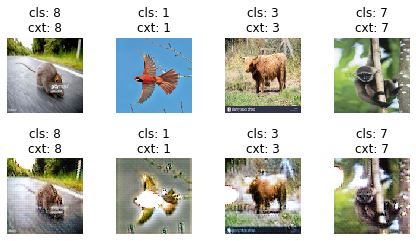

In [57]:
for epoch in range(5):
    # train
    for iteration, batch in enumerate(train_loader, 1):
        # forward
        real = batch['image'].to(device)
        fake = net_g(real)

        ######################
        # (1) Update D network
        ######################

        optimizer_d.zero_grad()
        
        # train with fake
        pred_fake = net_d.forward(fake.detach())
        loss_d_fake = criterionGAN(pred_fake, False)

        # train with real
        pred_real = net_d.forward(real)
        loss_d_real = criterionGAN(pred_real, True)
        
        # Combined D loss
        loss_d = (loss_d_fake + loss_d_real) * 0.5

        loss_d.backward()
       
        optimizer_d.step()

        ######################
        # (2) Update G network
        ######################

        optimizer_g.zero_grad()

        # First, G(A) should fake the discriminator
        pred_fake = net_d.forward(fake)
        loss_g_gan = criterionGAN(pred_fake, True)

        # Second, G(A) = B
        loss_g_l1 = criterionL1(fake, real) * 10
        
        loss_g = loss_g_gan + loss_g_l1
        
        loss_g.backward()

        optimizer_g.step()

        print("===> Epoch[{}]({}/{}): Loss_D: {:.4f} Loss_G: {:.4f}".format(
            epoch, iteration, len(train_loader), loss_d.item(), loss_g.item()))

    for i in range(len(valid_dataset)):
        j = np.random.randint(0, len(valid_dataset))
        sample = valid_dataset[j]
        ax = plt.subplot(2, 4, i + 1)
        plt.tight_layout()
        ax.set_title('cls: {}\ncxt: {}'.format(np.argmax([sample['cls'].numpy()], axis=1)[0], 
                                               np.argmax([sample['cxt'].numpy()], axis=1)[0]))
        ax.axis('off')
        plt.imshow(sample['image'].numpy().transpose(1, 2, 0))


        print(i, j, sample['image'].shape)

        sample['image'] = net_g(sample['image'].unsqueeze_(0).to(device))
        ax = plt.subplot(2, 4, 5+i)
        plt.tight_layout()
        ax.set_title('cls: {}\ncxt: {}'.format(np.argmax([sample['cls'].numpy()], axis=1)[0], 
                                               np.argmax([sample['cxt'].numpy()], axis=1)[0]))
        ax.axis('off')
        plt.imshow(sample['image'].cpu().detach().squeeze(0).numpy().transpose(1, 2, 0))

        if i == 3:
            plt.show()
            break

In [41]:
from tqdm import tqdm

In [48]:
h_epochs = []
h_train_acc_0 = []
h_valid_acc_0 = []
h_valid_losses_0 = []
h_train_losses_0 = []

print('epoch \t encd_train \t 0_valid \t 0_train \t 1_train')
for epoch in range(10):
    model_0.train()
    
    correct_cls = 0 
    total_cls = 0
    for batch_i, batch in tqdm(enumerate(train_loader), total=len(train_loader), leave=False):
        
        # Update Model 0 Discriminator
        optimizer_0.zero_grad()

        imgs = batch['image']
        cls = batch['cls'].to(device)
        batches_done = len(train_loader) * epoch + batch_i
        imgs = Variable(imgs.to(device))
        
        g_imgs = imgs
        cls_ = model_0(g_imgs)
        loss_0_train = clsBCE(cls_, cls)
        loss_0_train.backward()
        optimizer_0.step()
            
        _, predicted = torch.max(cls_, 1)
        _, actuals = torch.max(cls, 1)
        correct_cls += (predicted == actuals).sum().item()
        total_cls += cls.shape[0]
        
    h_train_acc_0.append(correct_cls/total_cls)


    if epoch % 1 == 0:        
        vloss_0 = 0
        bcount = 0
        
        correct = 0
        total = 0
        
        for batch_i, batch in tqdm(enumerate(valid_loader), total=len(valid_loader), leave=False):
            imgs = batch['image']
            cls = batch['cls'].to(device)
            cxt = batch['cxt'].to(device)
                
            imgs = Variable(imgs.to(device))        
            g_imgs = imgs
            cls_ = model_0(g_imgs)
            loss_0 = _BCE(cls_, cls)
            
            _, predicted = torch.max(cls_, 1)
            _, actuals = torch.max(cls, 1)
            correct += (predicted == actuals).sum().item()
            total += cls.shape[0]
            
            bcount += 1 
            vloss_0 += loss_0.item()
            
        h_valid_acc_0.append(correct/total)  
        print('{} \t {:.4f}({:.2f}) \t {:.4f}({:.2f})'.format(
            epoch,
            vloss_0/bcount, h_valid_acc_0[-1],
            loss_0_train.item(), h_train_acc_0[-1],
        ))

        h_epochs.append(epoch)
        h_valid_losses_0.append(vloss_0/bcount)
        h_train_losses_0.append(loss_0_train.item())

epoch 	 encd_train 	 0_valid 	 0_train 	 1_train


0 	 0.2969(0.28) 	 0.2532(0.37)


1 	 0.2849(0.33) 	 0.2512(0.44)


2 	 0.2982(0.31) 	 0.2727(0.52)


3 	 0.2994(0.32) 	 0.2167(0.61)


4 	 0.3082(0.32) 	 0.1346(0.71)


5 	 0.3167(0.30) 	 0.1436(0.79)


6 	 0.3462(0.27) 	 0.0976(0.86)


7 	 0.3484(0.29) 	 0.0794(0.90)


8 	 0.3710(0.29) 	 0.0517(0.94)


9 	 0.3838(0.27) 	 0.0419(0.96)


In [50]:
h_train_acc_1 = []
h_train_losses_1 = []
print('epoch \t 1_train')
for epoch in range(10):
    model_1.train()
    
    correct_cxt = 0
    total_cxt = 0
    for batch_i, batch in tqdm(enumerate(train_loader), total=len(train_loader), leave=False):
        
        # Update Model 1 Discriminator
        optimizer_1.zero_grad()
        
        g_imgs = imgs
        cxt_ = model_1(g_imgs)
        loss_1_train = cxtBCE(cxt_, cxt)
        loss_1_train.backward()
        optimizer_1.step()
            
        _, predicted = torch.max(cxt_, 1)
        _, actuals = torch.max(cxt, 1)
        correct_cxt += (predicted == actuals).sum().item()
        total_cxt += cls.shape[0]
          
    h_train_acc_1.append(correct_cxt/total_cxt)
    h_train_losses_1.append(loss_1_train.item())
    
    print('{} \t {:.4f}({:.2f})'.format(
        epoch,
        loss_1_train.item(), h_train_acc_1[-1]
    ))

epoch 	 1_train


0 	 0.0122(1.00)


1 	 0.0066(1.00)


2 	 0.0040(1.00)


3 	 0.0026(1.00)


4 	 0.0018(1.00)


5 	 0.0012(1.00)


6 	 0.0009(1.00)


7 	 0.0006(1.00)


8 	 0.0005(1.00)


9 	 0.0003(1.00)


In [51]:
EPOCHS = 10
IMAGE_SIZE=128
EPSILON = -np.log(1/NUM_CXT)
ALPHA = 1
ACC_BEST = 0

In [60]:
import warnings
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
warnings.simplefilter("ignore")
h_epochs = []
h_train_losses_g = []
h_valid_losses_0 = []
h_train_losses_0 = []
h_valid_acc_0 = []
h_train_acc_0 = []
h_train_losses_1 = []
h_train_acc_1 = []

epoch 	 encd_train 	 0_valid 	 0_train 	 1_train




  0%|          | 0/532 [00:00<?, ?it/s]

  0%|          | 1/532 [00:00<07:39,  1.15it/s]

  0%|          | 2/532 [00:01<06:37,  1.33it/s]

  1%|          | 3/532 [00:01<05:55,  1.49it/s]

  1%|          | 4/532 [00:02<05:25,  1.62it/s]

  1%|          | 5/532 [00:02<05:04,  1.73it/s]

  1%|          | 6/532 [00:03<04:50,  1.81it/s]

  1%|▏         | 7/532 [00:03<04:39,  1.88it/s]

  2%|▏         | 8/532 [00:04<04:32,  1.92it/s]

  2%|▏         | 9/532 [00:04<04:27,  1.96it/s]

  2%|▏         | 10/532 [00:05<04:23,  1.98it/s]

  2%|▏         | 11/532 [00:05<04:20,  2.00it/s]

  2%|▏         | 12/532 [00:06<04:18,  2.01it/s]

  2%|▏         | 13/532 [00:06<04:17,  2.02it/s]

  3%|▎         | 14/532 [00:07<04:16,  2.02it/s]

  3%|▎         | 15/532 [00:07<04:15,  2.02it/s]

  3%|▎         | 16/532 [00:08<04:14,  2.03it/s]

  3%|▎         | 17/532 [00:08<04:14,  2.03it/s]

  3%|▎         | 18/532 [00:09<04:13,  2.03it/s]

  4%|▎         | 19/532 [00:09<04:12,  2.03it/s]

  4%|▍         |

 27%|██▋       | 145/532 [01:13<03:16,  1.97it/s]

 27%|██▋       | 146/532 [01:13<03:16,  1.97it/s]

 28%|██▊       | 147/532 [01:14<03:15,  1.97it/s]

 28%|██▊       | 148/532 [01:14<03:15,  1.97it/s]

 28%|██▊       | 149/532 [01:15<03:14,  1.97it/s]

 28%|██▊       | 150/532 [01:15<03:14,  1.97it/s]

 28%|██▊       | 151/532 [01:16<03:13,  1.97it/s]

 29%|██▊       | 152/532 [01:16<03:13,  1.97it/s]

 29%|██▉       | 153/532 [01:17<03:12,  1.96it/s]

 29%|██▉       | 154/532 [01:17<03:12,  1.97it/s]

 29%|██▉       | 155/532 [01:18<03:11,  1.97it/s]

 29%|██▉       | 156/532 [01:18<03:11,  1.97it/s]

 30%|██▉       | 157/532 [01:19<03:10,  1.97it/s]

 30%|██▉       | 158/532 [01:19<03:10,  1.97it/s]

 30%|██▉       | 159/532 [01:20<03:09,  1.97it/s]

 30%|███       | 160/532 [01:20<03:09,  1.97it/s]

 30%|███       | 161/532 [01:21<03:08,  1.96it/s]

 30%|███       | 162/532 [01:21<03:08,  1.96it/s]

 31%|███       | 163/532 [01:22<03:07,  1.96it/s]

 31%|███       | 164/532 [01:22

 54%|█████▍    | 288/532 [02:26<02:04,  1.96it/s]

 54%|█████▍    | 289/532 [02:27<02:04,  1.95it/s]

 55%|█████▍    | 290/532 [02:27<02:03,  1.95it/s]

 55%|█████▍    | 291/532 [02:28<02:03,  1.95it/s]

 55%|█████▍    | 292/532 [02:28<02:02,  1.95it/s]

 55%|█████▌    | 293/532 [02:29<02:02,  1.95it/s]

 55%|█████▌    | 294/532 [02:29<02:01,  1.95it/s]

 55%|█████▌    | 295/532 [02:30<02:01,  1.95it/s]

 56%|█████▌    | 296/532 [02:30<02:00,  1.96it/s]

 56%|█████▌    | 297/532 [02:31<02:00,  1.95it/s]

 56%|█████▌    | 298/532 [02:31<01:59,  1.96it/s]

 56%|█████▌    | 299/532 [02:32<01:59,  1.96it/s]

 56%|█████▋    | 300/532 [02:32<01:58,  1.95it/s]

 57%|█████▋    | 301/532 [02:33<01:58,  1.95it/s]

 57%|█████▋    | 302/532 [02:33<01:57,  1.95it/s]

 57%|█████▋    | 303/532 [02:34<01:57,  1.95it/s]

 57%|█████▋    | 304/532 [02:34<01:56,  1.95it/s]

 57%|█████▋    | 305/532 [02:35<01:56,  1.95it/s]

 58%|█████▊    | 306/532 [02:35<01:55,  1.95it/s]

 58%|█████▊    | 307/532 [02:36

 81%|████████  | 431/532 [03:39<00:51,  1.95it/s]

 81%|████████  | 432/532 [03:40<00:51,  1.95it/s]

 81%|████████▏ | 433/532 [03:40<00:50,  1.95it/s]

 82%|████████▏ | 434/532 [03:41<00:50,  1.95it/s]

 82%|████████▏ | 435/532 [03:41<00:49,  1.95it/s]

 82%|████████▏ | 436/532 [03:42<00:49,  1.95it/s]

 82%|████████▏ | 437/532 [03:42<00:48,  1.95it/s]

 82%|████████▏ | 438/532 [03:43<00:48,  1.95it/s]

 83%|████████▎ | 439/532 [03:43<00:47,  1.95it/s]

 83%|████████▎ | 440/532 [03:44<00:47,  1.95it/s]

 83%|████████▎ | 441/532 [03:44<00:46,  1.95it/s]

 83%|████████▎ | 442/532 [03:45<00:46,  1.95it/s]

 83%|████████▎ | 443/532 [03:45<00:45,  1.95it/s]

 83%|████████▎ | 444/532 [03:46<00:45,  1.95it/s]

 84%|████████▎ | 445/532 [03:46<00:44,  1.95it/s]

 84%|████████▍ | 446/532 [03:47<00:44,  1.95it/s]

 84%|████████▍ | 447/532 [03:48<00:43,  1.95it/s]

 84%|████████▍ | 448/532 [03:48<00:43,  1.95it/s]

 84%|████████▍ | 449/532 [03:49<00:42,  1.95it/s]

 85%|████████▍ | 450/532 [03:49

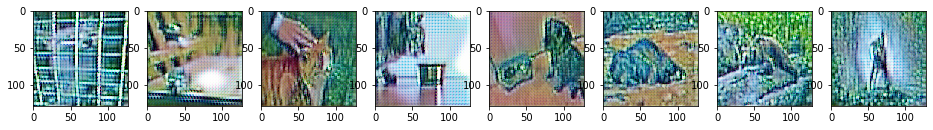

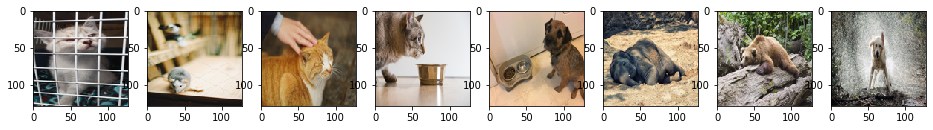



  0%|          | 0/270 [00:00<?, ?it/s]

  0%|          | 1/270 [00:00<01:38,  2.74it/s]

  1%|          | 2/270 [00:00<01:20,  3.33it/s]

  1%|          | 3/270 [00:00<01:18,  3.39it/s]

  1%|▏         | 4/270 [00:01<01:24,  3.14it/s]

  2%|▏         | 5/270 [00:01<01:17,  3.43it/s]

  2%|▏         | 6/270 [00:01<01:19,  3.31it/s]

  3%|▎         | 7/270 [00:01<01:12,  3.62it/s]

  3%|▎         | 8/270 [00:02<01:06,  3.96it/s]

  3%|▎         | 9/270 [00:02<01:02,  4.15it/s]

  4%|▎         | 10/270 [00:02<00:56,  4.59it/s]

  4%|▍         | 11/270 [00:02<01:08,  3.79it/s]

  4%|▍         | 12/270 [00:03<00:56,  4.56it/s]

  5%|▍         | 13/270 [00:03<00:58,  4.40it/s]

  5%|▌         | 14/270 [00:03<01:19,  3.21it/s]

  6%|▌         | 15/270 [00:03<01:06,  3.86it/s]

  6%|▌         | 16/270 [00:04<01:02,  4.09it/s]

  6%|▋         | 17/270 [00:04<00:59,  4.24it/s]

  7%|▋         | 18/270 [00:04<00:57,  4.41it/s]

  7%|▋         | 19/270 [00:04<00:52,  4.81it/s]

  7%|▋         |

 54%|█████▎    | 145/270 [00:39<00:25,  4.97it/s]

 54%|█████▍    | 146/270 [00:39<00:28,  4.34it/s]

 54%|█████▍    | 147/270 [00:39<00:25,  4.77it/s]

 55%|█████▍    | 148/270 [00:39<00:25,  4.80it/s]

 56%|█████▌    | 150/270 [00:40<00:23,  5.20it/s]

 56%|█████▌    | 151/270 [00:40<00:22,  5.18it/s]

 56%|█████▋    | 152/270 [00:40<00:24,  4.85it/s]

 57%|█████▋    | 153/270 [00:40<00:26,  4.46it/s]

 57%|█████▋    | 154/270 [00:41<00:24,  4.65it/s]

 57%|█████▋    | 155/270 [00:41<00:24,  4.77it/s]

 58%|█████▊    | 156/270 [00:41<00:21,  5.26it/s]

 58%|█████▊    | 157/270 [00:41<00:34,  3.23it/s]

 59%|█████▊    | 158/270 [00:42<00:28,  3.93it/s]

 59%|█████▉    | 159/270 [00:42<00:23,  4.78it/s]

 59%|█████▉    | 160/270 [00:42<00:19,  5.51it/s]

 60%|█████▉    | 161/270 [00:42<00:22,  4.74it/s]

 60%|██████    | 162/270 [00:42<00:26,  4.04it/s]

 60%|██████    | 163/270 [00:43<00:35,  2.99it/s]

 61%|██████    | 164/270 [00:43<00:30,  3.52it/s]

 61%|██████    | 165/270 [00:43

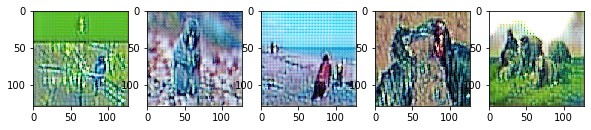

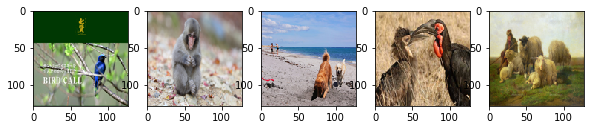

0 	 -1.8017 	 0.2968(0.27) 	 0.2822(0.26) 	 0.2385(0.34)




  0%|          | 0/532 [00:00<?, ?it/s]

  0%|          | 1/532 [00:00<05:38,  1.57it/s]

  0%|          | 2/532 [00:01<05:14,  1.69it/s]

  1%|          | 3/532 [00:01<04:57,  1.78it/s]

  1%|          | 4/532 [00:02<04:46,  1.85it/s]

  1%|          | 5/532 [00:02<04:37,  1.90it/s]

  1%|          | 6/532 [00:03<04:31,  1.93it/s]

  1%|▏         | 7/532 [00:03<04:27,  1.96it/s]

  2%|▏         | 8/532 [00:04<04:24,  1.98it/s]

  2%|▏         | 9/532 [00:04<04:22,  1.99it/s]

  2%|▏         | 10/532 [00:05<04:20,  2.00it/s]

  2%|▏         | 11/532 [00:05<04:19,  2.01it/s]

  2%|▏         | 12/532 [00:06<04:18,  2.01it/s]

  2%|▏         | 13/532 [00:06<04:17,  2.02it/s]

  3%|▎         | 14/532 [00:07<04:16,  2.02it/s]

  3%|▎         | 15/532 [00:07<04:16,  2.02it/s]

  3%|▎         | 16/532 [00:08<04:15,  2.02it/s]

  3%|▎         | 17/532 [00:08<04:15,  2.02it/s]

  3%|▎         | 18/532 [00:09<04:14,  2.02it/s]

  4%|▎         | 19/532 [00:09<04:14,  2.02it/s]

  4%|▍         |

 27%|██▋       | 145/532 [01:13<03:17,  1.96it/s]

 27%|██▋       | 146/532 [01:13<03:17,  1.96it/s]

 28%|██▊       | 147/532 [01:14<03:16,  1.96it/s]

 28%|██▊       | 148/532 [01:14<03:16,  1.96it/s]

 28%|██▊       | 149/532 [01:15<03:15,  1.96it/s]

 28%|██▊       | 150/532 [01:15<03:15,  1.96it/s]

 28%|██▊       | 151/532 [01:16<03:14,  1.96it/s]

 29%|██▊       | 152/532 [01:16<03:14,  1.96it/s]

 29%|██▉       | 153/532 [01:17<03:13,  1.96it/s]

 29%|██▉       | 154/532 [01:17<03:13,  1.96it/s]

 29%|██▉       | 155/532 [01:18<03:12,  1.96it/s]

 29%|██▉       | 156/532 [01:18<03:12,  1.96it/s]

 30%|██▉       | 157/532 [01:19<03:11,  1.96it/s]

 30%|██▉       | 158/532 [01:19<03:11,  1.95it/s]

 30%|██▉       | 159/532 [01:20<03:10,  1.96it/s]

 30%|███       | 160/532 [01:20<03:10,  1.96it/s]

 30%|███       | 161/532 [01:21<03:09,  1.95it/s]

 30%|███       | 162/532 [01:21<03:09,  1.96it/s]

 31%|███       | 163/532 [01:22<03:08,  1.96it/s]

 31%|███       | 164/532 [01:23

 54%|█████▍    | 288/532 [02:26<02:05,  1.95it/s]

 54%|█████▍    | 289/532 [02:27<02:04,  1.95it/s]

 55%|█████▍    | 290/532 [02:27<02:04,  1.95it/s]

 55%|█████▍    | 291/532 [02:28<02:03,  1.95it/s]

 55%|█████▍    | 292/532 [02:28<02:03,  1.95it/s]

 55%|█████▌    | 293/532 [02:29<02:02,  1.95it/s]

 55%|█████▌    | 294/532 [02:29<02:02,  1.95it/s]

 55%|█████▌    | 295/532 [02:30<02:01,  1.95it/s]

 56%|█████▌    | 296/532 [02:30<02:01,  1.95it/s]

 56%|█████▌    | 297/532 [02:31<02:00,  1.95it/s]

 56%|█████▌    | 298/532 [02:31<02:00,  1.95it/s]

 56%|█████▌    | 299/532 [02:32<01:59,  1.95it/s]

 56%|█████▋    | 300/532 [02:32<01:59,  1.95it/s]

 57%|█████▋    | 301/532 [02:33<01:58,  1.95it/s]

 57%|█████▋    | 302/532 [02:33<01:58,  1.95it/s]

 57%|█████▋    | 303/532 [02:34<01:57,  1.95it/s]

 57%|█████▋    | 304/532 [02:34<01:56,  1.95it/s]

 57%|█████▋    | 305/532 [02:35<01:56,  1.95it/s]

 58%|█████▊    | 306/532 [02:35<01:55,  1.95it/s]

 58%|█████▊    | 307/532 [02:36

 81%|████████  | 431/532 [03:40<00:51,  1.95it/s]

 81%|████████  | 432/532 [03:40<00:51,  1.95it/s]

 81%|████████▏ | 433/532 [03:41<00:50,  1.95it/s]

 82%|████████▏ | 434/532 [03:41<00:50,  1.95it/s]

 82%|████████▏ | 435/532 [03:42<00:49,  1.95it/s]

 82%|████████▏ | 436/532 [03:42<00:49,  1.95it/s]

 82%|████████▏ | 437/532 [03:43<00:48,  1.95it/s]

 82%|████████▏ | 438/532 [03:43<00:48,  1.95it/s]

 83%|████████▎ | 439/532 [03:44<00:47,  1.95it/s]

 83%|████████▎ | 440/532 [03:45<00:47,  1.95it/s]

 83%|████████▎ | 441/532 [03:45<00:46,  1.95it/s]

 83%|████████▎ | 442/532 [03:46<00:46,  1.95it/s]

 83%|████████▎ | 443/532 [03:46<00:45,  1.95it/s]

 83%|████████▎ | 444/532 [03:47<00:45,  1.95it/s]

 84%|████████▎ | 445/532 [03:47<00:44,  1.95it/s]

 84%|████████▍ | 446/532 [03:48<00:44,  1.95it/s]

 84%|████████▍ | 447/532 [03:48<00:43,  1.95it/s]

 84%|████████▍ | 448/532 [03:49<00:43,  1.95it/s]

 84%|████████▍ | 449/532 [03:49<00:42,  1.95it/s]

 85%|████████▍ | 450/532 [03:50

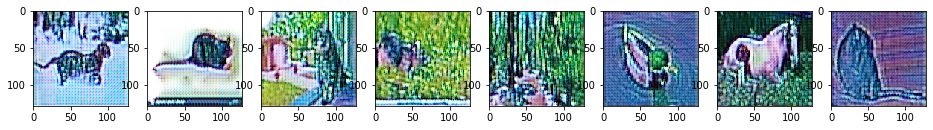

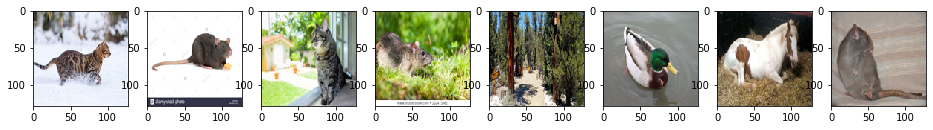



  0%|          | 0/270 [00:00<?, ?it/s]

  0%|          | 1/270 [00:00<02:04,  2.17it/s]

  1%|          | 2/270 [00:00<01:38,  2.71it/s]

  1%|          | 3/270 [00:00<01:22,  3.23it/s]

  1%|▏         | 4/270 [00:00<01:13,  3.62it/s]

  2%|▏         | 5/270 [00:01<01:08,  3.90it/s]

  2%|▏         | 6/270 [00:01<01:12,  3.65it/s]

  3%|▎         | 7/270 [00:01<01:17,  3.38it/s]

  3%|▎         | 8/270 [00:02<01:09,  3.79it/s]

  3%|▎         | 9/270 [00:02<01:04,  4.06it/s]

  4%|▎         | 10/270 [00:02<00:55,  4.66it/s]

  4%|▍         | 11/270 [00:02<00:57,  4.54it/s]

  4%|▍         | 12/270 [00:02<00:59,  4.37it/s]

  5%|▍         | 13/270 [00:03<01:03,  4.06it/s]

  5%|▌         | 14/270 [00:03<01:09,  3.66it/s]

  6%|▌         | 15/270 [00:03<01:19,  3.19it/s]

  6%|▌         | 16/270 [00:04<01:25,  2.98it/s]

  6%|▋         | 17/270 [00:04<01:15,  3.36it/s]

  7%|▋         | 18/270 [00:04<01:06,  3.81it/s]

  7%|▋         | 19/270 [00:05<01:17,  3.22it/s]

  7%|▋         |

 54%|█████▎    | 145/270 [00:38<00:32,  3.80it/s]

 54%|█████▍    | 146/270 [00:39<00:40,  3.03it/s]

 54%|█████▍    | 147/270 [00:39<00:38,  3.19it/s]

 55%|█████▍    | 148/270 [00:39<00:34,  3.55it/s]

 55%|█████▌    | 149/270 [00:39<00:40,  3.01it/s]

 56%|█████▌    | 150/270 [00:40<00:35,  3.40it/s]

 56%|█████▌    | 151/270 [00:40<00:39,  3.04it/s]

 56%|█████▋    | 152/270 [00:40<00:38,  3.05it/s]

 57%|█████▋    | 153/270 [00:41<00:37,  3.10it/s]

 57%|█████▋    | 154/270 [00:41<00:34,  3.41it/s]

 57%|█████▋    | 155/270 [00:41<00:29,  3.96it/s]

 58%|█████▊    | 156/270 [00:41<00:31,  3.58it/s]

 58%|█████▊    | 157/270 [00:42<00:26,  4.29it/s]

 59%|█████▊    | 158/270 [00:42<00:22,  4.97it/s]

 59%|█████▉    | 159/270 [00:42<00:38,  2.92it/s]

 59%|█████▉    | 160/270 [00:42<00:30,  3.60it/s]

 60%|█████▉    | 161/270 [00:43<00:27,  4.03it/s]

 60%|██████    | 162/270 [00:43<00:24,  4.44it/s]

 60%|██████    | 163/270 [00:43<00:22,  4.79it/s]

 61%|██████    | 164/270 [00:43

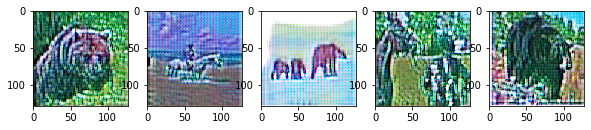

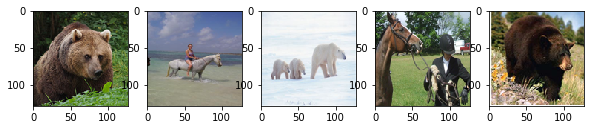

1 	 -1.8984 	 0.3029(0.28) 	 0.2168(0.37) 	 0.2034(0.45)




  0%|          | 0/532 [00:00<?, ?it/s]

  0%|          | 1/532 [00:00<06:12,  1.43it/s]

  0%|          | 2/532 [00:01<05:38,  1.57it/s]

  1%|          | 3/532 [00:01<05:14,  1.68it/s]

  1%|          | 4/532 [00:02<04:58,  1.77it/s]

  1%|          | 5/532 [00:02<04:46,  1.84it/s]

  1%|          | 6/532 [00:03<04:38,  1.89it/s]

  1%|▏         | 7/532 [00:03<04:32,  1.93it/s]

  2%|▏         | 8/532 [00:04<04:27,  1.96it/s]

  2%|▏         | 9/532 [00:04<04:24,  1.97it/s]

  2%|▏         | 10/532 [00:05<04:22,  1.99it/s]

  2%|▏         | 11/532 [00:05<04:20,  2.00it/s]

  2%|▏         | 12/532 [00:06<04:19,  2.00it/s]

  2%|▏         | 13/532 [00:06<04:18,  2.01it/s]

  3%|▎         | 14/532 [00:07<04:17,  2.01it/s]

  3%|▎         | 15/532 [00:07<04:17,  2.01it/s]

  3%|▎         | 16/532 [00:08<04:16,  2.01it/s]

  3%|▎         | 17/532 [00:08<04:16,  2.01it/s]

  3%|▎         | 18/532 [00:09<04:15,  2.01it/s]

  4%|▎         | 19/532 [00:09<04:15,  2.01it/s]

  4%|▍         |

 27%|██▋       | 145/532 [01:13<03:17,  1.96it/s]

 27%|██▋       | 146/532 [01:13<03:17,  1.96it/s]

 28%|██▊       | 147/532 [01:14<03:16,  1.95it/s]

 28%|██▊       | 148/532 [01:14<03:16,  1.96it/s]

 28%|██▊       | 149/532 [01:15<03:15,  1.95it/s]

 28%|██▊       | 150/532 [01:16<03:15,  1.96it/s]

 28%|██▊       | 151/532 [01:16<03:14,  1.96it/s]

 29%|██▊       | 152/532 [01:17<03:14,  1.96it/s]

 29%|██▉       | 153/532 [01:17<03:13,  1.95it/s]

 29%|██▉       | 154/532 [01:18<03:13,  1.96it/s]

 29%|██▉       | 155/532 [01:18<03:12,  1.95it/s]

 29%|██▉       | 156/532 [01:19<03:12,  1.95it/s]

 30%|██▉       | 157/532 [01:19<03:11,  1.95it/s]

 30%|██▉       | 158/532 [01:20<03:11,  1.95it/s]

 30%|██▉       | 159/532 [01:20<03:10,  1.95it/s]

 30%|███       | 160/532 [01:21<03:10,  1.95it/s]

 30%|███       | 161/532 [01:21<03:09,  1.95it/s]

 30%|███       | 162/532 [01:22<03:09,  1.95it/s]

 31%|███       | 163/532 [01:22<03:08,  1.95it/s]

 31%|███       | 164/532 [01:23

 54%|█████▍    | 288/532 [02:26<02:05,  1.95it/s]

 54%|█████▍    | 289/532 [02:27<02:04,  1.95it/s]

 55%|█████▍    | 290/532 [02:27<02:04,  1.95it/s]

 55%|█████▍    | 291/532 [02:28<02:03,  1.95it/s]

 55%|█████▍    | 292/532 [02:28<02:03,  1.95it/s]

 55%|█████▌    | 293/532 [02:29<02:02,  1.95it/s]

 55%|█████▌    | 294/532 [02:30<02:02,  1.95it/s]

 55%|█████▌    | 295/532 [02:30<02:01,  1.95it/s]

 56%|█████▌    | 296/532 [02:31<02:01,  1.95it/s]

 56%|█████▌    | 297/532 [02:31<02:00,  1.95it/s]

 56%|█████▌    | 298/532 [02:32<02:00,  1.95it/s]

 56%|█████▌    | 299/532 [02:32<01:59,  1.95it/s]

 56%|█████▋    | 300/532 [02:33<01:59,  1.95it/s]

 57%|█████▋    | 301/532 [02:33<01:58,  1.95it/s]

 57%|█████▋    | 302/532 [02:34<01:58,  1.95it/s]

 57%|█████▋    | 303/532 [02:34<01:57,  1.95it/s]

 57%|█████▋    | 304/532 [02:35<01:56,  1.95it/s]

 57%|█████▋    | 305/532 [02:35<01:56,  1.95it/s]

 58%|█████▊    | 306/532 [02:36<01:55,  1.95it/s]

 58%|█████▊    | 307/532 [02:36

 81%|████████  | 431/532 [03:40<00:51,  1.95it/s]

 81%|████████  | 432/532 [03:40<00:51,  1.95it/s]

 81%|████████▏ | 433/532 [03:41<00:50,  1.95it/s]

 82%|████████▏ | 434/532 [03:41<00:50,  1.95it/s]

 82%|████████▏ | 435/532 [03:42<00:49,  1.95it/s]

 82%|████████▏ | 436/532 [03:42<00:49,  1.95it/s]

 82%|████████▏ | 437/532 [03:43<00:48,  1.95it/s]

 82%|████████▏ | 438/532 [03:43<00:48,  1.95it/s]

 83%|████████▎ | 439/532 [03:44<00:47,  1.95it/s]

 83%|████████▎ | 440/532 [03:44<00:47,  1.95it/s]

 83%|████████▎ | 441/532 [03:45<00:46,  1.95it/s]

 83%|████████▎ | 442/532 [03:45<00:46,  1.95it/s]

 83%|████████▎ | 443/532 [03:46<00:45,  1.95it/s]

 83%|████████▎ | 444/532 [03:46<00:45,  1.95it/s]

 84%|████████▎ | 445/532 [03:47<00:44,  1.95it/s]

 84%|████████▍ | 446/532 [03:48<00:44,  1.95it/s]

 84%|████████▍ | 447/532 [03:48<00:43,  1.95it/s]

 84%|████████▍ | 448/532 [03:49<00:43,  1.95it/s]

 84%|████████▍ | 449/532 [03:49<00:42,  1.95it/s]

 85%|████████▍ | 450/532 [03:50

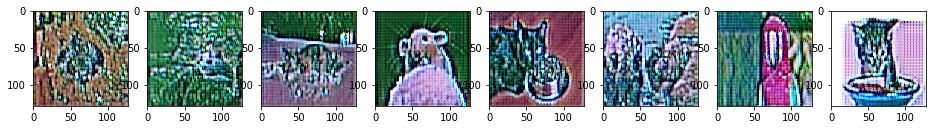

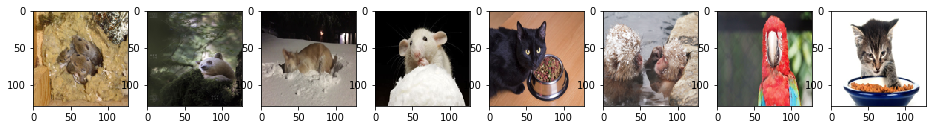



  0%|          | 0/270 [00:00<?, ?it/s]

  0%|          | 1/270 [00:00<01:02,  4.31it/s]

  1%|          | 2/270 [00:00<01:10,  3.82it/s]

  1%|          | 3/270 [00:00<01:11,  3.74it/s]

  1%|▏         | 4/270 [00:01<01:03,  4.17it/s]

  2%|▏         | 5/270 [00:01<01:38,  2.70it/s]

  2%|▏         | 6/270 [00:01<01:23,  3.18it/s]

  3%|▎         | 7/270 [00:02<01:10,  3.75it/s]

  3%|▎         | 8/270 [00:02<01:01,  4.25it/s]

  3%|▎         | 9/270 [00:02<00:59,  4.37it/s]

  4%|▎         | 10/270 [00:03<01:33,  2.77it/s]

  4%|▍         | 11/270 [00:03<01:18,  3.31it/s]

  4%|▍         | 12/270 [00:03<01:05,  3.96it/s]

  5%|▍         | 13/270 [00:03<01:24,  3.06it/s]

  5%|▌         | 14/270 [00:04<01:08,  3.72it/s]

  6%|▌         | 15/270 [00:04<01:03,  4.02it/s]

  6%|▌         | 16/270 [00:04<01:04,  3.96it/s]

  6%|▋         | 17/270 [00:04<01:04,  3.92it/s]

  7%|▋         | 18/270 [00:04<01:01,  4.09it/s]

  7%|▋         | 19/270 [00:05<00:58,  4.26it/s]

  7%|▋         |

 55%|█████▌    | 149/270 [00:40<00:47,  2.52it/s]

 56%|█████▌    | 150/270 [00:40<00:38,  3.09it/s]

 56%|█████▌    | 151/270 [00:40<00:32,  3.61it/s]

 56%|█████▋    | 152/270 [00:40<00:34,  3.39it/s]

 57%|█████▋    | 153/270 [00:40<00:30,  3.86it/s]

 57%|█████▋    | 154/270 [00:41<00:32,  3.56it/s]

 57%|█████▋    | 155/270 [00:41<00:46,  2.50it/s]

 58%|█████▊    | 156/270 [00:42<00:42,  2.70it/s]

 58%|█████▊    | 157/270 [00:42<00:42,  2.66it/s]

 59%|█████▊    | 158/270 [00:42<00:35,  3.18it/s]

 59%|█████▉    | 159/270 [00:42<00:29,  3.72it/s]

 59%|█████▉    | 160/270 [00:43<00:28,  3.83it/s]

 60%|█████▉    | 161/270 [00:43<00:24,  4.49it/s]

 60%|██████    | 162/270 [00:43<00:21,  5.01it/s]

 60%|██████    | 163/270 [00:43<00:21,  5.02it/s]

 61%|██████    | 164/270 [00:43<00:21,  4.92it/s]

 61%|██████    | 165/270 [00:44<00:19,  5.40it/s]

 61%|██████▏   | 166/270 [00:44<00:29,  3.53it/s]

 62%|██████▏   | 167/270 [00:44<00:24,  4.13it/s]

 62%|██████▏   | 168/270 [00:45

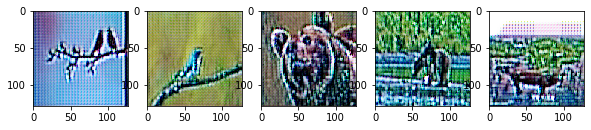

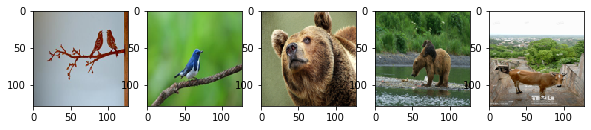

Saving Best...
2 	 -1.8573 	 0.2953(0.32) 	 0.2662(0.46) 	 0.2349(0.51)




  0%|          | 0/532 [00:00<?, ?it/s]

  0%|          | 1/532 [00:00<05:57,  1.49it/s]

  0%|          | 2/532 [00:01<05:27,  1.62it/s]

  1%|          | 3/532 [00:01<05:07,  1.72it/s]

  1%|          | 4/532 [00:02<04:52,  1.80it/s]

  1%|          | 5/532 [00:02<04:42,  1.87it/s]

  1%|          | 6/532 [00:03<04:35,  1.91it/s]

  1%|▏         | 7/532 [00:03<04:29,  1.94it/s]

  2%|▏         | 8/532 [00:04<04:26,  1.97it/s]

  2%|▏         | 9/532 [00:04<04:23,  1.99it/s]

  2%|▏         | 10/532 [00:05<04:21,  2.00it/s]

  2%|▏         | 11/532 [00:05<04:20,  2.00it/s]

  2%|▏         | 12/532 [00:06<04:18,  2.01it/s]

  2%|▏         | 13/532 [00:06<04:18,  2.01it/s]

  3%|▎         | 14/532 [00:07<04:17,  2.01it/s]

  3%|▎         | 15/532 [00:07<04:16,  2.02it/s]

  3%|▎         | 16/532 [00:08<04:15,  2.02it/s]

  3%|▎         | 17/532 [00:08<04:15,  2.02it/s]

  3%|▎         | 18/532 [00:09<04:15,  2.01it/s]

  4%|▎         | 19/532 [00:09<04:14,  2.01it/s]

  4%|▍         |

 27%|██▋       | 145/532 [01:13<03:17,  1.96it/s]

 27%|██▋       | 146/532 [01:13<03:17,  1.96it/s]

 28%|██▊       | 147/532 [01:14<03:16,  1.96it/s]

 28%|██▊       | 148/532 [01:14<03:16,  1.96it/s]

 28%|██▊       | 149/532 [01:15<03:15,  1.96it/s]

 28%|██▊       | 150/532 [01:15<03:15,  1.96it/s]

 28%|██▊       | 151/532 [01:16<03:14,  1.96it/s]

 29%|██▊       | 152/532 [01:16<03:14,  1.95it/s]

 29%|██▉       | 153/532 [01:17<03:13,  1.95it/s]

 29%|██▉       | 154/532 [01:17<03:13,  1.96it/s]

 29%|██▉       | 155/532 [01:18<03:12,  1.95it/s]

 29%|██▉       | 156/532 [01:18<03:12,  1.95it/s]

 30%|██▉       | 157/532 [01:19<03:11,  1.96it/s]

 30%|██▉       | 158/532 [01:20<03:11,  1.96it/s]

 30%|██▉       | 159/532 [01:20<03:10,  1.96it/s]

 30%|███       | 160/532 [01:21<03:10,  1.96it/s]

 30%|███       | 161/532 [01:21<03:09,  1.95it/s]

 30%|███       | 162/532 [01:22<03:09,  1.96it/s]

 31%|███       | 163/532 [01:22<03:08,  1.95it/s]

 31%|███       | 164/532 [01:23

 54%|█████▍    | 288/532 [02:26<02:05,  1.95it/s]

 54%|█████▍    | 289/532 [02:27<02:04,  1.95it/s]

 55%|█████▍    | 290/532 [02:27<02:04,  1.95it/s]

 55%|█████▍    | 291/532 [02:28<02:03,  1.95it/s]

 55%|█████▍    | 292/532 [02:28<02:03,  1.95it/s]

 55%|█████▌    | 293/532 [02:29<02:02,  1.95it/s]

 55%|█████▌    | 294/532 [02:29<02:02,  1.95it/s]

 55%|█████▌    | 295/532 [02:30<02:01,  1.95it/s]

 56%|█████▌    | 296/532 [02:30<02:01,  1.95it/s]

 56%|█████▌    | 297/532 [02:31<02:00,  1.95it/s]

 56%|█████▌    | 298/532 [02:31<02:00,  1.95it/s]

 56%|█████▌    | 299/532 [02:32<01:59,  1.95it/s]

 56%|█████▋    | 300/532 [02:32<01:59,  1.95it/s]

 57%|█████▋    | 301/532 [02:33<01:58,  1.95it/s]

 57%|█████▋    | 302/532 [02:33<01:58,  1.95it/s]

 57%|█████▋    | 303/532 [02:34<01:57,  1.95it/s]

 57%|█████▋    | 304/532 [02:34<01:57,  1.95it/s]

 57%|█████▋    | 305/532 [02:35<01:56,  1.95it/s]

 58%|█████▊    | 306/532 [02:35<01:55,  1.95it/s]

 58%|█████▊    | 307/532 [02:36

 81%|████████  | 431/532 [03:40<00:51,  1.95it/s]

 81%|████████  | 432/532 [03:40<00:51,  1.95it/s]

 81%|████████▏ | 433/532 [03:41<00:50,  1.95it/s]

 82%|████████▏ | 434/532 [03:41<00:50,  1.95it/s]

 82%|████████▏ | 435/532 [03:42<00:49,  1.95it/s]

 82%|████████▏ | 436/532 [03:42<00:49,  1.95it/s]

 82%|████████▏ | 437/532 [03:43<00:48,  1.95it/s]

 82%|████████▏ | 438/532 [03:43<00:48,  1.95it/s]

 83%|████████▎ | 439/532 [03:44<00:47,  1.95it/s]

 83%|████████▎ | 440/532 [03:44<00:47,  1.95it/s]

 83%|████████▎ | 441/532 [03:45<00:46,  1.95it/s]

 83%|████████▎ | 442/532 [03:45<00:46,  1.95it/s]

 83%|████████▎ | 443/532 [03:46<00:45,  1.95it/s]

 83%|████████▎ | 444/532 [03:46<00:45,  1.95it/s]

 84%|████████▎ | 445/532 [03:47<00:44,  1.95it/s]

 84%|████████▍ | 446/532 [03:47<00:44,  1.95it/s]

 84%|████████▍ | 447/532 [03:48<00:43,  1.95it/s]

 84%|████████▍ | 448/532 [03:48<00:43,  1.95it/s]

 84%|████████▍ | 449/532 [03:49<00:42,  1.95it/s]

 85%|████████▍ | 450/532 [03:49

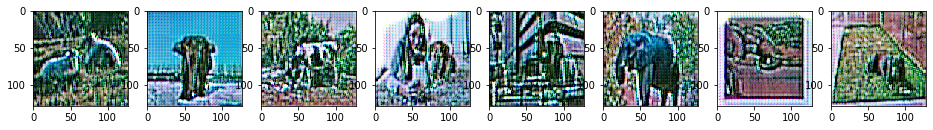

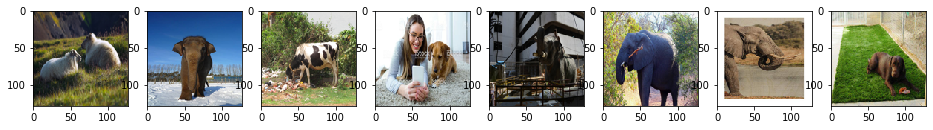



  0%|          | 0/270 [00:00<?, ?it/s]

  0%|          | 1/270 [00:00<00:54,  4.91it/s]

  1%|          | 2/270 [00:00<01:07,  3.98it/s]

  1%|          | 3/270 [00:00<01:18,  3.38it/s]

  1%|▏         | 4/270 [00:01<01:13,  3.61it/s]

  2%|▏         | 5/270 [00:01<01:17,  3.44it/s]

  2%|▏         | 6/270 [00:01<01:17,  3.39it/s]

  3%|▎         | 7/270 [00:02<01:28,  2.96it/s]

  3%|▎         | 8/270 [00:02<01:29,  2.94it/s]

  3%|▎         | 9/270 [00:03<01:38,  2.66it/s]

  4%|▎         | 10/270 [00:03<01:37,  2.66it/s]

  4%|▍         | 11/270 [00:03<01:25,  3.02it/s]

  4%|▍         | 12/270 [00:04<01:37,  2.63it/s]

  5%|▍         | 13/270 [00:04<01:27,  2.95it/s]

  5%|▌         | 14/270 [00:04<01:21,  3.16it/s]

  6%|▌         | 15/270 [00:05<01:28,  2.87it/s]

  6%|▌         | 16/270 [00:05<01:27,  2.91it/s]

  6%|▋         | 17/270 [00:05<01:24,  2.98it/s]

  7%|▋         | 18/270 [00:05<01:17,  3.27it/s]

  7%|▋         | 19/270 [00:06<01:07,  3.71it/s]

  7%|▋         |

 55%|█████▌    | 149/270 [00:40<00:31,  3.83it/s]

 56%|█████▌    | 150/270 [00:42<01:08,  1.75it/s]

 56%|█████▌    | 151/270 [00:42<01:00,  1.97it/s]

 56%|█████▋    | 152/270 [00:42<00:46,  2.52it/s]

 57%|█████▋    | 153/270 [00:42<00:37,  3.15it/s]

 57%|█████▋    | 154/270 [00:42<00:31,  3.65it/s]

 57%|█████▋    | 155/270 [00:43<00:39,  2.88it/s]

 58%|█████▊    | 156/270 [00:43<00:35,  3.26it/s]

 58%|█████▊    | 157/270 [00:43<00:35,  3.21it/s]

 59%|█████▊    | 158/270 [00:44<00:33,  3.35it/s]

 59%|█████▉    | 159/270 [00:44<00:28,  3.83it/s]

 59%|█████▉    | 160/270 [00:44<00:33,  3.30it/s]

 60%|█████▉    | 161/270 [00:44<00:28,  3.87it/s]

 60%|██████    | 162/270 [00:45<00:35,  3.03it/s]

 61%|██████    | 164/270 [00:46<00:34,  3.08it/s]

 61%|██████    | 165/270 [00:46<00:30,  3.43it/s]

 61%|██████▏   | 166/270 [00:46<00:30,  3.44it/s]

 62%|██████▏   | 167/270 [00:46<00:32,  3.22it/s]

 62%|██████▏   | 168/270 [00:47<00:30,  3.31it/s]

 63%|██████▎   | 169/270 [00:47

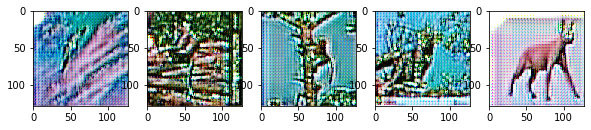

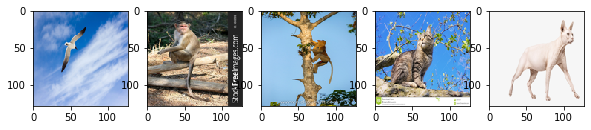

3 	 -1.9505 	 0.3151(0.32) 	 0.2424(0.57) 	 0.1916(0.60)




  0%|          | 0/532 [00:00<?, ?it/s]

  0%|          | 1/532 [00:00<08:23,  1.06it/s]

  0%|          | 2/532 [00:01<07:09,  1.23it/s]

  1%|          | 3/532 [00:01<06:18,  1.40it/s]

  1%|          | 4/532 [00:02<05:42,  1.54it/s]

  1%|          | 5/532 [00:02<05:17,  1.66it/s]

  1%|          | 6/532 [00:03<04:59,  1.76it/s]

  1%|▏         | 7/532 [00:03<04:46,  1.83it/s]

  2%|▏         | 8/532 [00:04<04:37,  1.89it/s]

  2%|▏         | 9/532 [00:04<04:31,  1.93it/s]

  2%|▏         | 10/532 [00:05<04:27,  1.95it/s]

  2%|▏         | 11/532 [00:05<04:23,  1.98it/s]

  2%|▏         | 12/532 [00:06<04:21,  1.99it/s]

  2%|▏         | 13/532 [00:06<04:19,  2.00it/s]

  3%|▎         | 14/532 [00:07<04:18,  2.01it/s]

  3%|▎         | 15/532 [00:07<04:17,  2.01it/s]

  3%|▎         | 16/532 [00:08<04:16,  2.01it/s]

  3%|▎         | 17/532 [00:08<04:15,  2.01it/s]

  3%|▎         | 18/532 [00:09<04:15,  2.01it/s]

  4%|▎         | 19/532 [00:09<04:14,  2.01it/s]

  4%|▍         |

 27%|██▋       | 145/532 [01:13<03:17,  1.96it/s]

 27%|██▋       | 146/532 [01:14<03:17,  1.96it/s]

 28%|██▊       | 147/532 [01:14<03:16,  1.96it/s]

 28%|██▊       | 148/532 [01:15<03:16,  1.96it/s]

 28%|██▊       | 149/532 [01:15<03:15,  1.96it/s]

 28%|██▊       | 150/532 [01:16<03:15,  1.96it/s]

 28%|██▊       | 151/532 [01:16<03:14,  1.96it/s]

 29%|██▊       | 152/532 [01:17<03:14,  1.96it/s]

 29%|██▉       | 153/532 [01:17<03:13,  1.96it/s]

 29%|██▉       | 154/532 [01:18<03:13,  1.96it/s]

 29%|██▉       | 155/532 [01:18<03:34,  1.75it/s]

 29%|██▉       | 156/532 [01:19<03:27,  1.81it/s]

 30%|██▉       | 157/532 [01:19<03:22,  1.85it/s]

 30%|██▉       | 158/532 [01:20<03:18,  1.88it/s]

 30%|██▉       | 159/532 [01:20<03:16,  1.90it/s]

 30%|███       | 160/532 [01:21<03:13,  1.92it/s]

 30%|███       | 161/532 [01:21<03:12,  1.93it/s]

 30%|███       | 162/532 [01:22<03:11,  1.94it/s]

 31%|███       | 163/532 [01:23<03:10,  1.94it/s]

 31%|███       | 164/532 [01:23

 54%|█████▍    | 288/532 [02:27<02:05,  1.95it/s]

 54%|█████▍    | 289/532 [02:27<02:04,  1.95it/s]

 55%|█████▍    | 290/532 [02:28<02:04,  1.95it/s]

 55%|█████▍    | 291/532 [02:28<02:03,  1.95it/s]

 55%|█████▍    | 292/532 [02:29<02:03,  1.95it/s]

 55%|█████▌    | 293/532 [02:29<02:02,  1.95it/s]

 55%|█████▌    | 294/532 [02:30<02:02,  1.95it/s]

 55%|█████▌    | 295/532 [02:30<02:01,  1.95it/s]

 56%|█████▌    | 296/532 [02:31<02:01,  1.95it/s]

 56%|█████▌    | 297/532 [02:31<02:00,  1.95it/s]

 56%|█████▌    | 298/532 [02:32<02:00,  1.95it/s]

 56%|█████▌    | 299/532 [02:32<01:59,  1.95it/s]

 56%|█████▋    | 300/532 [02:33<01:59,  1.95it/s]

 57%|█████▋    | 301/532 [02:33<01:58,  1.95it/s]

 57%|█████▋    | 302/532 [02:34<01:58,  1.95it/s]

 57%|█████▋    | 303/532 [02:34<01:57,  1.95it/s]

 57%|█████▋    | 304/532 [02:35<01:57,  1.95it/s]

 57%|█████▋    | 305/532 [02:35<01:56,  1.95it/s]

 58%|█████▊    | 306/532 [02:36<01:55,  1.95it/s]

 58%|█████▊    | 307/532 [02:36

 81%|████████  | 431/532 [03:40<00:51,  1.95it/s]

 81%|████████  | 432/532 [03:40<00:51,  1.95it/s]

 81%|████████▏ | 433/532 [03:41<00:50,  1.95it/s]

 82%|████████▏ | 434/532 [03:42<00:50,  1.95it/s]

 82%|████████▏ | 435/532 [03:42<00:49,  1.95it/s]

 82%|████████▏ | 436/532 [03:43<00:49,  1.95it/s]

 82%|████████▏ | 437/532 [03:43<00:48,  1.95it/s]

 82%|████████▏ | 438/532 [03:44<00:48,  1.95it/s]

 83%|████████▎ | 439/532 [03:44<00:47,  1.95it/s]

 83%|████████▎ | 440/532 [03:45<00:47,  1.95it/s]

 83%|████████▎ | 441/532 [03:45<00:46,  1.95it/s]

 83%|████████▎ | 442/532 [03:46<00:46,  1.95it/s]

 83%|████████▎ | 443/532 [03:46<00:45,  1.95it/s]

 83%|████████▎ | 444/532 [03:47<00:45,  1.95it/s]

 84%|████████▎ | 445/532 [03:47<00:44,  1.95it/s]

 84%|████████▍ | 446/532 [03:48<00:44,  1.95it/s]

 84%|████████▍ | 447/532 [03:48<00:43,  1.95it/s]

 84%|████████▍ | 448/532 [03:49<00:43,  1.95it/s]

 84%|████████▍ | 449/532 [03:49<00:42,  1.95it/s]

 85%|████████▍ | 450/532 [03:50

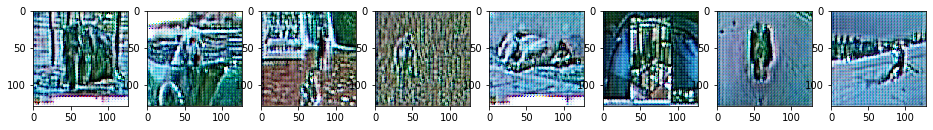

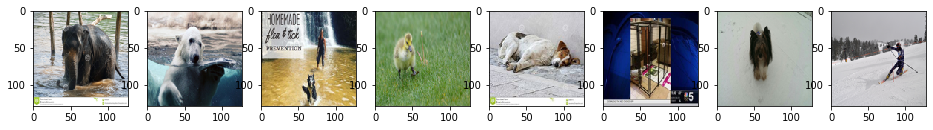



  0%|          | 0/270 [00:00<?, ?it/s]

  0%|          | 1/270 [00:00<02:00,  2.24it/s]

  1%|          | 2/270 [00:00<01:57,  2.28it/s]

  1%|          | 3/270 [00:01<01:47,  2.47it/s]

  1%|▏         | 4/270 [00:01<01:29,  2.99it/s]

  2%|▏         | 5/270 [00:01<01:17,  3.40it/s]

  2%|▏         | 6/270 [00:01<01:24,  3.12it/s]

  3%|▎         | 7/270 [00:02<01:15,  3.50it/s]

  3%|▎         | 8/270 [00:02<01:12,  3.60it/s]

  3%|▎         | 9/270 [00:02<01:01,  4.22it/s]

  4%|▎         | 10/270 [00:02<01:04,  4.03it/s]

  4%|▍         | 11/270 [00:03<01:12,  3.56it/s]

  4%|▍         | 12/270 [00:03<00:59,  4.37it/s]

  5%|▍         | 13/270 [00:03<01:06,  3.87it/s]

  5%|▌         | 14/270 [00:04<01:16,  3.35it/s]

  6%|▌         | 16/270 [00:04<01:16,  3.32it/s]

  6%|▋         | 17/270 [00:04<01:15,  3.35it/s]

  7%|▋         | 18/270 [00:05<01:06,  3.80it/s]

  7%|▋         | 19/270 [00:05<01:02,  3.99it/s]

  7%|▋         | 20/270 [00:05<01:04,  3.87it/s]

  8%|▊         |

 55%|█████▌    | 149/270 [00:39<00:42,  2.88it/s]

 56%|█████▌    | 150/270 [00:39<00:35,  3.36it/s]

 56%|█████▌    | 151/270 [00:39<00:30,  3.94it/s]

 56%|█████▋    | 152/270 [00:39<00:29,  4.00it/s]

 57%|█████▋    | 153/270 [00:39<00:24,  4.79it/s]

 57%|█████▋    | 154/270 [00:39<00:23,  4.84it/s]

 57%|█████▋    | 155/270 [00:40<00:25,  4.44it/s]

 58%|█████▊    | 156/270 [00:40<00:32,  3.50it/s]

 58%|█████▊    | 157/270 [00:41<00:40,  2.79it/s]

 59%|█████▊    | 158/270 [00:41<00:46,  2.39it/s]

 59%|█████▉    | 159/270 [00:41<00:38,  2.90it/s]

 59%|█████▉    | 160/270 [00:42<00:31,  3.47it/s]

 60%|█████▉    | 161/270 [00:42<00:29,  3.74it/s]

 60%|██████    | 162/270 [00:42<00:24,  4.48it/s]

 60%|██████    | 163/270 [00:42<00:21,  5.00it/s]

 61%|██████    | 164/270 [00:42<00:20,  5.22it/s]

 61%|██████    | 165/270 [00:43<00:28,  3.67it/s]

 61%|██████▏   | 166/270 [00:43<00:26,  4.00it/s]

 62%|██████▏   | 167/270 [00:43<00:29,  3.49it/s]

 62%|██████▏   | 168/270 [00:43

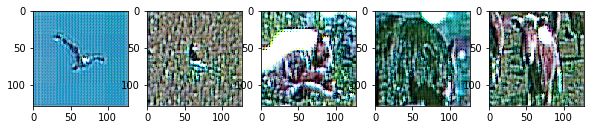

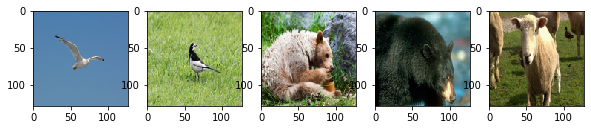

Saving Best...
4 	 -2.0833 	 0.3378(0.36) 	 0.1605(0.73) 	 0.1610(0.72)




  0%|          | 0/532 [00:00<?, ?it/s]

  0%|          | 1/532 [00:00<05:17,  1.67it/s]

  0%|          | 2/532 [00:01<05:00,  1.76it/s]

  1%|          | 3/532 [00:01<04:47,  1.84it/s]

  1%|          | 4/532 [00:02<04:39,  1.89it/s]

  1%|          | 5/532 [00:02<04:32,  1.93it/s]

  1%|          | 6/532 [00:03<04:28,  1.96it/s]

  1%|▏         | 7/532 [00:03<04:25,  1.98it/s]

  2%|▏         | 8/532 [00:04<04:23,  1.99it/s]

  2%|▏         | 9/532 [00:04<04:21,  2.00it/s]

  2%|▏         | 10/532 [00:05<04:19,  2.01it/s]

  2%|▏         | 11/532 [00:05<04:18,  2.01it/s]

  2%|▏         | 12/532 [00:06<04:18,  2.01it/s]

  2%|▏         | 13/532 [00:06<04:17,  2.02it/s]

  3%|▎         | 14/532 [00:07<04:16,  2.02it/s]

  3%|▎         | 15/532 [00:07<04:16,  2.02it/s]

  3%|▎         | 16/532 [00:08<04:15,  2.02it/s]

  3%|▎         | 17/532 [00:08<04:15,  2.02it/s]

  3%|▎         | 18/532 [00:08<04:14,  2.02it/s]

  4%|▎         | 19/532 [00:09<04:14,  2.02it/s]

  4%|▍         |

 27%|██▋       | 145/532 [01:13<03:17,  1.96it/s]

 27%|██▋       | 146/532 [01:13<03:17,  1.96it/s]

 28%|██▊       | 147/532 [01:14<03:16,  1.96it/s]

 28%|██▊       | 148/532 [01:14<03:16,  1.96it/s]

 28%|██▊       | 149/532 [01:15<03:15,  1.96it/s]

 28%|██▊       | 150/532 [01:15<03:15,  1.96it/s]

 28%|██▊       | 151/532 [01:16<03:14,  1.95it/s]

 29%|██▊       | 152/532 [01:16<03:14,  1.95it/s]

 29%|██▉       | 153/532 [01:17<03:13,  1.95it/s]

 29%|██▉       | 154/532 [01:17<03:13,  1.95it/s]

 29%|██▉       | 155/532 [01:18<03:12,  1.95it/s]

 29%|██▉       | 156/532 [01:18<03:12,  1.95it/s]

 30%|██▉       | 157/532 [01:19<03:11,  1.95it/s]

 30%|██▉       | 158/532 [01:19<03:11,  1.95it/s]

 30%|██▉       | 159/532 [01:20<03:10,  1.95it/s]

 30%|███       | 160/532 [01:20<03:10,  1.95it/s]

 30%|███       | 161/532 [01:21<03:09,  1.95it/s]

 30%|███       | 162/532 [01:21<03:09,  1.95it/s]

 31%|███       | 163/532 [01:22<03:08,  1.95it/s]

 31%|███       | 164/532 [01:23

 54%|█████▍    | 288/532 [02:26<02:05,  1.95it/s]

 54%|█████▍    | 289/532 [02:27<02:04,  1.95it/s]

 55%|█████▍    | 290/532 [02:27<02:04,  1.95it/s]

 55%|█████▍    | 291/532 [02:28<02:03,  1.95it/s]

 55%|█████▍    | 292/532 [02:28<02:03,  1.95it/s]

 55%|█████▌    | 293/532 [02:29<02:02,  1.95it/s]

 55%|█████▌    | 294/532 [02:29<02:02,  1.95it/s]

 55%|█████▌    | 295/532 [02:30<02:01,  1.95it/s]

 56%|█████▌    | 296/532 [02:30<02:01,  1.95it/s]

 56%|█████▌    | 297/532 [02:31<02:00,  1.95it/s]

 56%|█████▌    | 298/532 [02:31<02:00,  1.95it/s]

 56%|█████▌    | 299/532 [02:32<01:59,  1.95it/s]

 56%|█████▋    | 300/532 [02:32<01:59,  1.95it/s]

 57%|█████▋    | 301/532 [02:33<01:58,  1.95it/s]

 57%|█████▋    | 302/532 [02:33<01:57,  1.95it/s]

 57%|█████▋    | 303/532 [02:34<01:57,  1.95it/s]

 57%|█████▋    | 304/532 [02:34<01:57,  1.95it/s]

 57%|█████▋    | 305/532 [02:35<01:56,  1.95it/s]

 58%|█████▊    | 306/532 [02:35<01:56,  1.95it/s]

 58%|█████▊    | 307/532 [02:36

 81%|████████  | 431/532 [03:39<00:51,  1.95it/s]

 81%|████████  | 432/532 [03:40<00:51,  1.95it/s]

 81%|████████▏ | 433/532 [03:41<00:50,  1.95it/s]

 82%|████████▏ | 434/532 [03:41<00:50,  1.95it/s]

 82%|████████▏ | 435/532 [03:42<00:49,  1.95it/s]

 82%|████████▏ | 436/532 [03:42<00:49,  1.95it/s]

 82%|████████▏ | 437/532 [03:43<00:48,  1.95it/s]

 82%|████████▏ | 438/532 [03:43<00:48,  1.95it/s]

 83%|████████▎ | 439/532 [03:44<00:47,  1.95it/s]

 83%|████████▎ | 440/532 [03:44<00:47,  1.95it/s]

 83%|████████▎ | 441/532 [03:45<00:46,  1.95it/s]

 83%|████████▎ | 442/532 [03:45<00:46,  1.95it/s]

 83%|████████▎ | 443/532 [03:46<00:45,  1.95it/s]

 83%|████████▎ | 444/532 [03:46<00:45,  1.95it/s]

 84%|████████▎ | 445/532 [03:47<00:44,  1.95it/s]

 84%|████████▍ | 446/532 [03:47<00:44,  1.95it/s]

 84%|████████▍ | 447/532 [03:48<00:43,  1.95it/s]

 84%|████████▍ | 448/532 [03:48<00:43,  1.95it/s]

 84%|████████▍ | 449/532 [03:49<00:42,  1.95it/s]

 85%|████████▍ | 450/532 [03:49

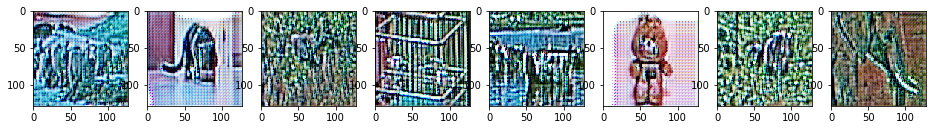

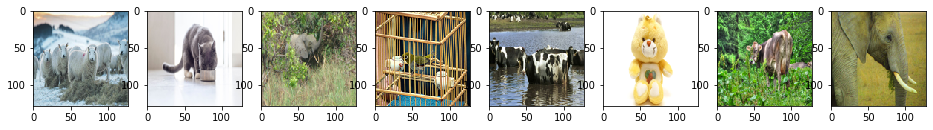



  0%|          | 0/270 [00:00<?, ?it/s]

  0%|          | 1/270 [00:00<01:28,  3.04it/s]

  1%|          | 2/270 [00:00<01:17,  3.48it/s]

  1%|          | 3/270 [00:00<01:20,  3.31it/s]

  1%|▏         | 4/270 [00:01<01:07,  3.92it/s]

  2%|▏         | 5/270 [00:01<01:10,  3.75it/s]

  2%|▏         | 6/270 [00:01<01:03,  4.18it/s]

  3%|▎         | 7/270 [00:01<01:18,  3.33it/s]

  3%|▎         | 8/270 [00:02<01:07,  3.89it/s]

  3%|▎         | 9/270 [00:02<00:58,  4.50it/s]

  4%|▎         | 10/270 [00:02<00:56,  4.64it/s]

  4%|▍         | 11/270 [00:02<01:05,  3.96it/s]

  4%|▍         | 12/270 [00:02<00:58,  4.43it/s]

  5%|▍         | 13/270 [00:03<00:52,  4.92it/s]

  5%|▌         | 14/270 [00:03<00:44,  5.72it/s]

  6%|▌         | 15/270 [00:03<00:40,  6.32it/s]

  6%|▌         | 16/270 [00:03<00:50,  5.02it/s]

  6%|▋         | 17/270 [00:04<01:13,  3.43it/s]

  7%|▋         | 18/270 [00:04<01:04,  3.93it/s]

  7%|▋         | 19/270 [00:04<01:00,  4.16it/s]

  7%|▋         |

 54%|█████▍    | 147/270 [00:39<00:33,  3.71it/s]

 55%|█████▍    | 148/270 [00:39<00:30,  3.95it/s]

 55%|█████▌    | 149/270 [00:39<00:29,  4.16it/s]

 56%|█████▌    | 150/270 [00:40<00:39,  3.05it/s]

 56%|█████▌    | 151/270 [00:40<00:33,  3.55it/s]

 56%|█████▋    | 152/270 [00:40<00:49,  2.41it/s]

 57%|█████▋    | 153/270 [00:41<00:39,  2.94it/s]

 57%|█████▋    | 154/270 [00:41<00:55,  2.08it/s]

 57%|█████▋    | 155/270 [00:42<00:46,  2.46it/s]

 58%|█████▊    | 156/270 [00:42<00:38,  2.98it/s]

 58%|█████▊    | 157/270 [00:42<00:39,  2.83it/s]

 59%|█████▊    | 158/270 [00:42<00:33,  3.31it/s]

 59%|█████▉    | 159/270 [00:43<00:29,  3.80it/s]

 59%|█████▉    | 160/270 [00:43<00:26,  4.10it/s]

 60%|█████▉    | 161/270 [00:43<00:25,  4.33it/s]

 60%|██████    | 162/270 [00:43<00:28,  3.77it/s]

 60%|██████    | 163/270 [00:44<00:26,  4.04it/s]

 61%|██████    | 165/270 [00:44<00:23,  4.46it/s]

 61%|██████▏   | 166/270 [00:45<00:35,  2.92it/s]

 62%|██████▏   | 167/270 [00:45

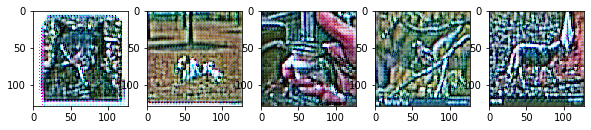

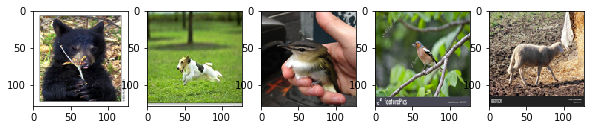

5 	 -2.1989 	 0.4433(0.26) 	 0.1185(0.88) 	 0.0687(0.86)




  0%|          | 0/532 [00:00<?, ?it/s]

  0%|          | 1/532 [00:00<06:16,  1.41it/s]

  0%|          | 2/532 [00:01<05:41,  1.55it/s]

  1%|          | 3/532 [00:01<05:16,  1.67it/s]

  1%|          | 4/532 [00:02<04:59,  1.76it/s]

  1%|          | 5/532 [00:02<04:47,  1.83it/s]

  1%|          | 6/532 [00:03<04:38,  1.89it/s]

  1%|▏         | 7/532 [00:03<04:32,  1.93it/s]

  2%|▏         | 8/532 [00:04<04:28,  1.95it/s]

  2%|▏         | 9/532 [00:04<04:24,  1.97it/s]

  2%|▏         | 10/532 [00:05<04:22,  1.99it/s]

  2%|▏         | 11/532 [00:05<04:20,  2.00it/s]

  2%|▏         | 12/532 [00:06<04:19,  2.00it/s]

  2%|▏         | 13/532 [00:06<04:18,  2.01it/s]

  3%|▎         | 14/532 [00:07<04:17,  2.01it/s]

  3%|▎         | 15/532 [00:07<04:16,  2.01it/s]

  3%|▎         | 16/532 [00:08<04:16,  2.01it/s]

  3%|▎         | 17/532 [00:08<04:15,  2.01it/s]

  3%|▎         | 18/532 [00:09<04:15,  2.01it/s]

  4%|▎         | 19/532 [00:09<04:15,  2.01it/s]

  4%|▍         |

 27%|██▋       | 145/532 [01:13<03:17,  1.96it/s]

 27%|██▋       | 146/532 [01:13<03:17,  1.96it/s]

 28%|██▊       | 147/532 [01:14<03:16,  1.96it/s]

 28%|██▊       | 148/532 [01:14<03:16,  1.96it/s]

 28%|██▊       | 149/532 [01:15<03:15,  1.96it/s]

 28%|██▊       | 150/532 [01:15<03:15,  1.96it/s]

 28%|██▊       | 151/532 [01:16<03:14,  1.96it/s]

 29%|██▊       | 152/532 [01:17<03:14,  1.96it/s]

 29%|██▉       | 153/532 [01:17<03:13,  1.96it/s]

 29%|██▉       | 154/532 [01:18<03:13,  1.96it/s]

 29%|██▉       | 155/532 [01:18<03:12,  1.96it/s]

 29%|██▉       | 156/532 [01:19<03:12,  1.96it/s]

 30%|██▉       | 157/532 [01:19<03:11,  1.96it/s]

 30%|██▉       | 158/532 [01:20<03:11,  1.95it/s]

 30%|██▉       | 159/532 [01:20<03:10,  1.95it/s]

 30%|███       | 160/532 [01:21<03:10,  1.95it/s]

 30%|███       | 161/532 [01:21<03:09,  1.95it/s]

 30%|███       | 162/532 [01:22<03:09,  1.95it/s]

 31%|███       | 163/532 [01:22<03:08,  1.95it/s]

 31%|███       | 164/532 [01:23

 54%|█████▍    | 288/532 [02:26<02:05,  1.95it/s]

 54%|█████▍    | 289/532 [02:27<02:04,  1.95it/s]

 55%|█████▍    | 290/532 [02:27<02:04,  1.95it/s]

 55%|█████▍    | 291/532 [02:28<02:03,  1.95it/s]

 55%|█████▍    | 292/532 [02:28<02:03,  1.95it/s]

 55%|█████▌    | 293/532 [02:29<02:02,  1.95it/s]

 55%|█████▌    | 294/532 [02:29<02:02,  1.95it/s]

 55%|█████▌    | 295/532 [02:30<02:01,  1.95it/s]

 56%|█████▌    | 296/532 [02:30<02:01,  1.95it/s]

 56%|█████▌    | 297/532 [02:31<02:00,  1.95it/s]

 56%|█████▌    | 298/532 [02:31<02:00,  1.95it/s]

 56%|█████▌    | 299/532 [02:32<01:59,  1.95it/s]

 56%|█████▋    | 300/532 [02:32<01:59,  1.95it/s]

 57%|█████▋    | 301/532 [02:33<01:58,  1.95it/s]

 57%|█████▋    | 302/532 [02:33<01:58,  1.95it/s]

 57%|█████▋    | 303/532 [02:34<01:57,  1.95it/s]

 57%|█████▋    | 304/532 [02:34<01:57,  1.95it/s]

 57%|█████▋    | 305/532 [02:35<02:10,  1.74it/s]

 58%|█████▊    | 306/532 [02:36<02:05,  1.80it/s]

 58%|█████▊    | 307/532 [02:36

 81%|████████  | 431/532 [03:40<00:51,  1.95it/s]

 81%|████████  | 432/532 [03:40<00:51,  1.95it/s]

 81%|████████▏ | 433/532 [03:41<00:50,  1.95it/s]

 82%|████████▏ | 434/532 [03:41<00:50,  1.95it/s]

 82%|████████▏ | 435/532 [03:42<00:49,  1.95it/s]

 82%|████████▏ | 436/532 [03:42<00:49,  1.95it/s]

 82%|████████▏ | 437/532 [03:43<00:48,  1.95it/s]

 82%|████████▏ | 438/532 [03:43<00:48,  1.95it/s]

 83%|████████▎ | 439/532 [03:44<00:47,  1.95it/s]

 83%|████████▎ | 440/532 [03:44<00:47,  1.95it/s]

 83%|████████▎ | 441/532 [03:45<00:46,  1.95it/s]

 83%|████████▎ | 442/532 [03:46<00:46,  1.95it/s]

 83%|████████▎ | 443/532 [03:46<00:45,  1.95it/s]

 83%|████████▎ | 444/532 [03:47<00:45,  1.95it/s]

 84%|████████▎ | 445/532 [03:47<00:44,  1.95it/s]

 84%|████████▍ | 446/532 [03:48<00:44,  1.95it/s]

 84%|████████▍ | 447/532 [03:48<00:43,  1.95it/s]

 84%|████████▍ | 448/532 [03:49<00:43,  1.95it/s]

 84%|████████▍ | 449/532 [03:49<00:42,  1.95it/s]

 85%|████████▍ | 450/532 [03:50

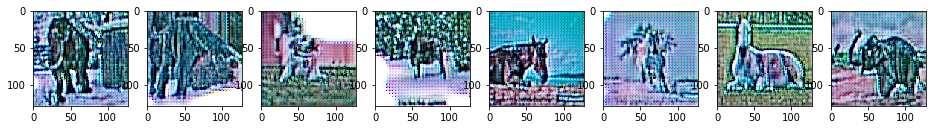

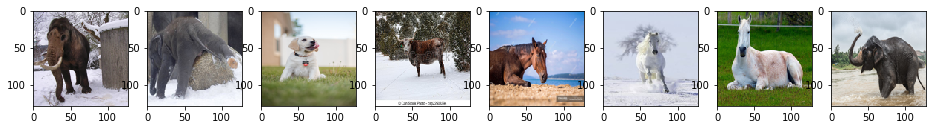



  0%|          | 0/270 [00:00<?, ?it/s]

  0%|          | 1/270 [00:00<01:57,  2.28it/s]

  1%|          | 2/270 [00:00<01:46,  2.53it/s]

  1%|          | 3/270 [00:01<01:46,  2.50it/s]

  1%|▏         | 4/270 [00:01<01:33,  2.85it/s]

  2%|▏         | 5/270 [00:01<01:37,  2.71it/s]

  2%|▏         | 6/270 [00:02<01:34,  2.80it/s]

  3%|▎         | 7/270 [00:02<01:27,  2.99it/s]

  3%|▎         | 8/270 [00:02<01:35,  2.75it/s]

  3%|▎         | 9/270 [00:03<01:29,  2.92it/s]

  4%|▎         | 10/270 [00:03<01:21,  3.19it/s]

  4%|▍         | 11/270 [00:03<01:14,  3.46it/s]

  4%|▍         | 12/270 [00:03<01:00,  4.26it/s]

  5%|▍         | 13/270 [00:03<01:00,  4.25it/s]

  5%|▌         | 14/270 [00:04<01:24,  3.04it/s]

  6%|▌         | 15/270 [00:04<01:18,  3.26it/s]

  6%|▌         | 16/270 [00:04<01:08,  3.73it/s]

  6%|▋         | 17/270 [00:05<00:58,  4.30it/s]

  7%|▋         | 18/270 [00:05<01:01,  4.06it/s]

  7%|▋         | 19/270 [00:05<00:56,  4.42it/s]

  7%|▋         |

 54%|█████▍    | 146/270 [00:40<00:24,  5.09it/s]

 54%|█████▍    | 147/270 [00:41<00:21,  5.81it/s]

 55%|█████▍    | 148/270 [00:41<00:30,  4.06it/s]

 55%|█████▌    | 149/270 [00:41<00:32,  3.70it/s]

 56%|█████▌    | 150/270 [00:42<00:36,  3.32it/s]

 56%|█████▌    | 151/270 [00:42<00:34,  3.45it/s]

 56%|█████▋    | 152/270 [00:42<00:34,  3.40it/s]

 57%|█████▋    | 153/270 [00:43<00:44,  2.64it/s]

 57%|█████▋    | 154/270 [00:43<00:38,  2.98it/s]

 57%|█████▋    | 155/270 [00:43<00:35,  3.28it/s]

 58%|█████▊    | 156/270 [00:44<00:31,  3.62it/s]

 58%|█████▊    | 157/270 [00:44<00:27,  4.11it/s]

 59%|█████▊    | 158/270 [00:44<00:26,  4.19it/s]

 59%|█████▉    | 159/270 [00:44<00:29,  3.81it/s]

 59%|█████▉    | 160/270 [00:45<00:32,  3.42it/s]

 60%|█████▉    | 161/270 [00:45<00:29,  3.70it/s]

 60%|██████    | 162/270 [00:45<00:40,  2.64it/s]

 60%|██████    | 163/270 [00:46<00:34,  3.07it/s]

 61%|██████    | 164/270 [00:46<00:29,  3.60it/s]

 61%|██████    | 165/270 [00:46

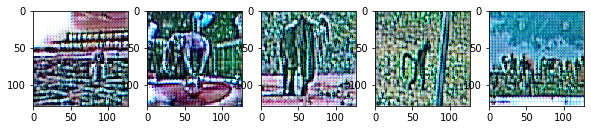

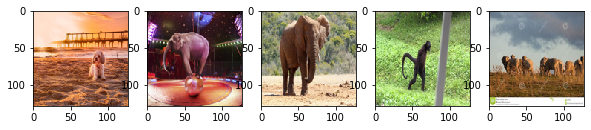

6 	 -2.2655 	 0.4602(0.29) 	 0.0434(0.94) 	 0.0314(0.94)




  0%|          | 0/532 [00:00<?, ?it/s]

  0%|          | 1/532 [00:00<06:39,  1.33it/s]

  0%|          | 2/532 [00:01<05:57,  1.48it/s]

  1%|          | 3/532 [00:01<05:28,  1.61it/s]

  1%|          | 4/532 [00:02<05:07,  1.72it/s]

  1%|          | 5/532 [00:02<04:52,  1.80it/s]

  1%|          | 6/532 [00:03<04:42,  1.86it/s]

  1%|▏         | 7/532 [00:03<04:34,  1.91it/s]

  2%|▏         | 8/532 [00:04<04:29,  1.94it/s]

  2%|▏         | 9/532 [00:04<04:26,  1.97it/s]

  2%|▏         | 10/532 [00:05<04:23,  1.98it/s]

  2%|▏         | 11/532 [00:05<04:21,  1.99it/s]

  2%|▏         | 12/532 [00:06<04:19,  2.00it/s]

  2%|▏         | 13/532 [00:06<04:18,  2.01it/s]

  3%|▎         | 14/532 [00:07<04:17,  2.01it/s]

  3%|▎         | 15/532 [00:07<04:16,  2.01it/s]

  3%|▎         | 16/532 [00:08<04:16,  2.01it/s]

  3%|▎         | 17/532 [00:08<04:15,  2.01it/s]

  3%|▎         | 18/532 [00:09<04:15,  2.01it/s]

  4%|▎         | 19/532 [00:09<04:14,  2.01it/s]

  4%|▍         |

 27%|██▋       | 145/532 [01:13<03:17,  1.96it/s]

 27%|██▋       | 146/532 [01:13<03:17,  1.96it/s]

 28%|██▊       | 147/532 [01:14<03:16,  1.96it/s]

 28%|██▊       | 148/532 [01:14<03:16,  1.96it/s]

 28%|██▊       | 149/532 [01:15<03:15,  1.96it/s]

 28%|██▊       | 150/532 [01:16<03:15,  1.96it/s]

 28%|██▊       | 151/532 [01:16<03:14,  1.96it/s]

 29%|██▊       | 152/532 [01:17<03:14,  1.96it/s]

 29%|██▉       | 153/532 [01:17<03:13,  1.96it/s]

 29%|██▉       | 154/532 [01:18<03:13,  1.96it/s]

 29%|██▉       | 155/532 [01:18<03:12,  1.96it/s]

 29%|██▉       | 156/532 [01:19<03:12,  1.96it/s]

 30%|██▉       | 157/532 [01:19<03:11,  1.96it/s]

 30%|██▉       | 158/532 [01:20<03:11,  1.96it/s]

 30%|██▉       | 159/532 [01:20<03:21,  1.85it/s]

 30%|███       | 160/532 [01:21<03:17,  1.88it/s]

 30%|███       | 161/532 [01:21<03:15,  1.90it/s]

 30%|███       | 162/532 [01:22<03:12,  1.92it/s]

 31%|███       | 163/532 [01:22<03:11,  1.93it/s]

 31%|███       | 164/532 [01:23

 54%|█████▍    | 288/532 [02:26<02:05,  1.95it/s]

 54%|█████▍    | 289/532 [02:27<02:04,  1.95it/s]

 55%|█████▍    | 290/532 [02:27<02:04,  1.95it/s]

 55%|█████▍    | 291/532 [02:28<02:03,  1.95it/s]

 55%|█████▍    | 292/532 [02:28<02:03,  1.95it/s]

 55%|█████▌    | 293/532 [02:29<02:02,  1.95it/s]

 55%|█████▌    | 294/532 [02:29<02:02,  1.95it/s]

 55%|█████▌    | 295/532 [02:30<02:01,  1.95it/s]

 56%|█████▌    | 296/532 [02:30<02:01,  1.95it/s]

 56%|█████▌    | 297/532 [02:31<02:00,  1.95it/s]

 56%|█████▌    | 298/532 [02:31<02:00,  1.95it/s]

 56%|█████▌    | 299/532 [02:32<01:59,  1.95it/s]

 56%|█████▋    | 300/532 [02:32<01:58,  1.95it/s]

 57%|█████▋    | 301/532 [02:33<01:58,  1.95it/s]

 57%|█████▋    | 302/532 [02:34<01:57,  1.95it/s]

 57%|█████▋    | 303/532 [02:34<01:57,  1.95it/s]

 57%|█████▋    | 304/532 [02:35<01:56,  1.95it/s]

 57%|█████▋    | 305/532 [02:35<01:56,  1.95it/s]

 58%|█████▊    | 306/532 [02:36<01:55,  1.95it/s]

 58%|█████▊    | 307/532 [02:36

 81%|████████  | 431/532 [03:40<00:51,  1.95it/s]

 81%|████████  | 432/532 [03:40<00:51,  1.95it/s]

 81%|████████▏ | 433/532 [03:41<00:50,  1.95it/s]

 82%|████████▏ | 434/532 [03:41<00:50,  1.95it/s]

 82%|████████▏ | 435/532 [03:42<00:49,  1.95it/s]

 82%|████████▏ | 436/532 [03:42<00:49,  1.95it/s]

 82%|████████▏ | 437/532 [03:43<00:48,  1.95it/s]

 82%|████████▏ | 438/532 [03:43<00:48,  1.95it/s]

 83%|████████▎ | 439/532 [03:44<00:47,  1.95it/s]

 83%|████████▎ | 440/532 [03:44<00:47,  1.95it/s]

 83%|████████▎ | 441/532 [03:45<00:46,  1.95it/s]

 83%|████████▎ | 442/532 [03:45<00:46,  1.95it/s]

 83%|████████▎ | 443/532 [03:46<00:45,  1.95it/s]

 83%|████████▎ | 444/532 [03:46<00:45,  1.95it/s]

 84%|████████▎ | 445/532 [03:47<00:44,  1.95it/s]

 84%|████████▍ | 446/532 [03:47<00:44,  1.95it/s]

 84%|████████▍ | 447/532 [03:48<00:43,  1.95it/s]

 84%|████████▍ | 448/532 [03:48<00:43,  1.95it/s]

 84%|████████▍ | 449/532 [03:49<00:42,  1.95it/s]

 85%|████████▍ | 450/532 [03:49

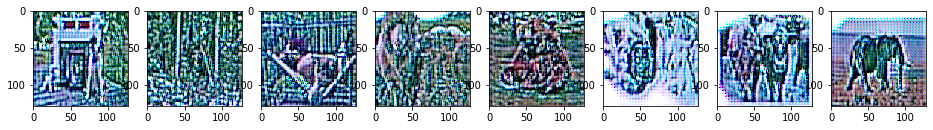

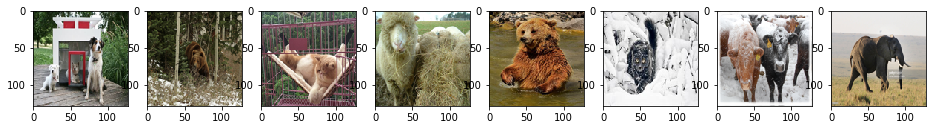



  0%|          | 0/270 [00:00<?, ?it/s]

  0%|          | 1/270 [00:00<01:27,  3.06it/s]

  1%|          | 2/270 [00:00<01:24,  3.19it/s]

  1%|          | 3/270 [00:00<01:12,  3.66it/s]

  1%|▏         | 4/270 [00:01<01:13,  3.63it/s]

  2%|▏         | 5/270 [00:01<01:05,  4.06it/s]

  2%|▏         | 6/270 [00:01<01:00,  4.36it/s]

  3%|▎         | 7/270 [00:01<00:58,  4.48it/s]

  3%|▎         | 8/270 [00:01<00:54,  4.80it/s]

  3%|▎         | 9/270 [00:01<00:50,  5.13it/s]

  4%|▎         | 10/270 [00:02<00:49,  5.28it/s]

  4%|▍         | 11/270 [00:02<00:52,  4.97it/s]

  4%|▍         | 12/270 [00:02<00:45,  5.66it/s]

  5%|▍         | 13/270 [00:02<00:48,  5.34it/s]

  5%|▌         | 14/270 [00:02<00:50,  5.05it/s]

  6%|▌         | 15/270 [00:03<00:50,  5.09it/s]

  6%|▌         | 16/270 [00:03<00:49,  5.15it/s]

  6%|▋         | 17/270 [00:03<00:50,  5.05it/s]

  7%|▋         | 18/270 [00:03<00:51,  4.93it/s]

  7%|▋         | 19/270 [00:04<00:57,  4.38it/s]

  7%|▋         |

 54%|█████▍    | 146/270 [00:36<00:26,  4.65it/s]

 54%|█████▍    | 147/270 [00:37<00:26,  4.70it/s]

 55%|█████▍    | 148/270 [00:37<00:22,  5.35it/s]

 55%|█████▌    | 149/270 [00:37<00:21,  5.61it/s]

 56%|█████▌    | 150/270 [00:37<00:26,  4.57it/s]

 56%|█████▌    | 151/270 [00:37<00:28,  4.19it/s]

 56%|█████▋    | 152/270 [00:38<00:25,  4.61it/s]

 57%|█████▋    | 153/270 [00:38<00:24,  4.81it/s]

 57%|█████▋    | 154/270 [00:38<00:31,  3.65it/s]

 58%|█████▊    | 156/270 [00:39<00:27,  4.14it/s]

 58%|█████▊    | 157/270 [00:39<00:27,  4.17it/s]

 59%|█████▊    | 158/270 [00:39<00:22,  4.91it/s]

 59%|█████▉    | 159/270 [00:39<00:23,  4.64it/s]

 59%|█████▉    | 160/270 [00:40<00:42,  2.60it/s]

 60%|█████▉    | 161/270 [00:40<00:33,  3.24it/s]

 60%|██████    | 162/270 [00:40<00:26,  4.02it/s]

 60%|██████    | 163/270 [00:40<00:25,  4.22it/s]

 61%|██████    | 164/270 [00:41<00:25,  4.14it/s]

 61%|██████    | 165/270 [00:41<00:26,  4.03it/s]

 61%|██████▏   | 166/270 [00:41

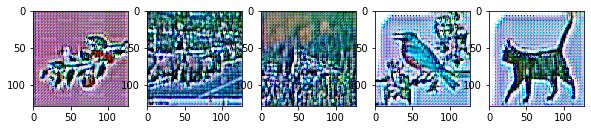

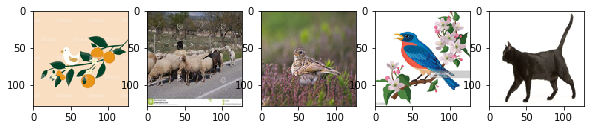

7 	 -2.2778 	 0.4838(0.31) 	 0.0478(0.97) 	 0.0220(0.96)




  0%|          | 0/532 [00:00<?, ?it/s]

  0%|          | 1/532 [00:00<07:02,  1.26it/s]

  0%|          | 2/532 [00:01<06:13,  1.42it/s]

  1%|          | 3/532 [00:01<05:39,  1.56it/s]

  1%|          | 4/532 [00:02<05:14,  1.68it/s]

  1%|          | 5/532 [00:02<04:57,  1.77it/s]

  1%|          | 6/532 [00:03<04:45,  1.84it/s]

  1%|▏         | 7/532 [00:03<04:49,  1.81it/s]

  2%|▏         | 8/532 [00:04<04:39,  1.87it/s]

  2%|▏         | 9/532 [00:04<04:32,  1.92it/s]

  2%|▏         | 10/532 [00:05<04:27,  1.95it/s]

  2%|▏         | 11/532 [00:05<04:24,  1.97it/s]

  2%|▏         | 12/532 [00:06<04:21,  1.99it/s]

  2%|▏         | 13/532 [00:06<04:19,  2.00it/s]

  3%|▎         | 14/532 [00:07<04:18,  2.01it/s]

  3%|▎         | 15/532 [00:07<04:17,  2.01it/s]

  3%|▎         | 16/532 [00:08<04:16,  2.01it/s]

  3%|▎         | 17/532 [00:08<04:15,  2.01it/s]

  3%|▎         | 18/532 [00:09<04:15,  2.01it/s]

  4%|▎         | 19/532 [00:09<04:14,  2.01it/s]

  4%|▍         |

 27%|██▋       | 145/532 [01:13<03:17,  1.96it/s]

 27%|██▋       | 146/532 [01:14<03:17,  1.96it/s]

 28%|██▊       | 147/532 [01:14<03:16,  1.96it/s]

 28%|██▊       | 148/532 [01:15<03:16,  1.96it/s]

 28%|██▊       | 149/532 [01:15<03:15,  1.96it/s]

 28%|██▊       | 150/532 [01:16<03:15,  1.96it/s]

 28%|██▊       | 151/532 [01:16<03:14,  1.96it/s]

 29%|██▊       | 152/532 [01:17<03:14,  1.96it/s]

 29%|██▉       | 153/532 [01:17<03:13,  1.96it/s]

 29%|██▉       | 154/532 [01:18<03:13,  1.96it/s]

 29%|██▉       | 155/532 [01:18<03:12,  1.96it/s]

 29%|██▉       | 156/532 [01:19<03:12,  1.96it/s]

 30%|██▉       | 157/532 [01:19<03:11,  1.96it/s]

 30%|██▉       | 158/532 [01:20<03:11,  1.96it/s]

 30%|██▉       | 159/532 [01:20<03:10,  1.96it/s]

 30%|███       | 160/532 [01:21<03:10,  1.96it/s]

 30%|███       | 161/532 [01:21<03:09,  1.96it/s]

 30%|███       | 162/532 [01:22<03:09,  1.96it/s]

 31%|███       | 163/532 [01:22<03:08,  1.95it/s]

 31%|███       | 164/532 [01:23

 54%|█████▍    | 288/532 [02:26<02:05,  1.95it/s]

 54%|█████▍    | 289/532 [02:27<02:04,  1.95it/s]

 55%|█████▍    | 290/532 [02:27<02:04,  1.95it/s]

 55%|█████▍    | 291/532 [02:28<02:03,  1.95it/s]

 55%|█████▍    | 292/532 [02:28<02:03,  1.95it/s]

 55%|█████▌    | 293/532 [02:29<02:02,  1.95it/s]

 55%|█████▌    | 294/532 [02:29<02:02,  1.95it/s]

 55%|█████▌    | 295/532 [02:30<02:01,  1.95it/s]

 56%|█████▌    | 296/532 [02:30<02:01,  1.95it/s]

 56%|█████▌    | 297/532 [02:31<02:00,  1.95it/s]

 56%|█████▌    | 298/532 [02:31<02:00,  1.95it/s]

 56%|█████▌    | 299/532 [02:32<01:59,  1.95it/s]

 56%|█████▋    | 300/532 [02:32<01:59,  1.95it/s]

 57%|█████▋    | 301/532 [02:33<01:58,  1.95it/s]

 57%|█████▋    | 302/532 [02:33<01:57,  1.95it/s]

 57%|█████▋    | 303/532 [02:34<01:57,  1.95it/s]

 57%|█████▋    | 304/532 [02:35<01:56,  1.95it/s]

 57%|█████▋    | 305/532 [02:35<01:56,  1.95it/s]

 58%|█████▊    | 306/532 [02:36<01:55,  1.95it/s]

 58%|█████▊    | 307/532 [02:36

 81%|████████  | 431/532 [03:40<00:51,  1.95it/s]

 81%|████████  | 432/532 [03:40<00:51,  1.95it/s]

 81%|████████▏ | 433/532 [03:41<00:50,  1.95it/s]

 82%|████████▏ | 434/532 [03:41<00:50,  1.95it/s]

 82%|████████▏ | 435/532 [03:42<00:49,  1.95it/s]

 82%|████████▏ | 436/532 [03:42<00:49,  1.95it/s]

 82%|████████▏ | 437/532 [03:43<00:48,  1.95it/s]

 82%|████████▏ | 438/532 [03:43<00:48,  1.95it/s]

 83%|████████▎ | 439/532 [03:44<00:47,  1.95it/s]

 83%|████████▎ | 440/532 [03:44<00:47,  1.95it/s]

 83%|████████▎ | 441/532 [03:45<00:46,  1.95it/s]

 83%|████████▎ | 442/532 [03:45<00:46,  1.95it/s]

 83%|████████▎ | 443/532 [03:46<00:45,  1.95it/s]

 83%|████████▎ | 444/532 [03:46<00:45,  1.95it/s]

 84%|████████▎ | 445/532 [03:47<00:44,  1.95it/s]

 84%|████████▍ | 446/532 [03:47<00:44,  1.95it/s]

 84%|████████▍ | 447/532 [03:48<00:43,  1.95it/s]

 84%|████████▍ | 448/532 [03:48<00:43,  1.95it/s]

 84%|████████▍ | 449/532 [03:49<00:42,  1.95it/s]

 85%|████████▍ | 450/532 [03:49

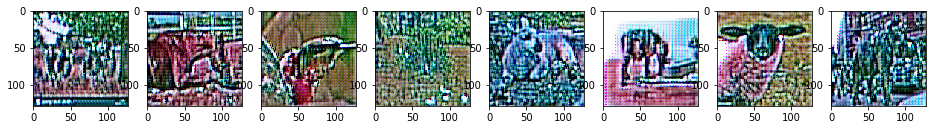

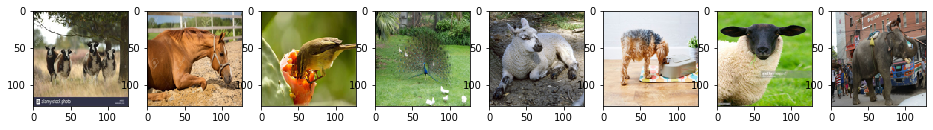



  0%|          | 0/270 [00:00<?, ?it/s]

  0%|          | 1/270 [00:00<01:50,  2.44it/s]

  1%|          | 2/270 [00:00<01:41,  2.63it/s]

  1%|          | 3/270 [00:01<01:43,  2.57it/s]

  1%|▏         | 4/270 [00:01<01:51,  2.39it/s]

  2%|▏         | 5/270 [00:01<01:36,  2.74it/s]

  2%|▏         | 6/270 [00:02<01:20,  3.29it/s]

  3%|▎         | 7/270 [00:02<01:36,  2.73it/s]

  3%|▎         | 8/270 [00:02<01:27,  2.98it/s]

  3%|▎         | 9/270 [00:03<01:20,  3.25it/s]

  4%|▎         | 10/270 [00:03<01:13,  3.55it/s]

  4%|▍         | 11/270 [00:03<01:36,  2.70it/s]

  4%|▍         | 12/270 [00:04<01:36,  2.67it/s]

  5%|▍         | 13/270 [00:04<01:25,  3.02it/s]

  5%|▌         | 14/270 [00:04<01:14,  3.46it/s]

  6%|▌         | 15/270 [00:04<01:08,  3.74it/s]

  6%|▌         | 16/270 [00:05<01:19,  3.20it/s]

  6%|▋         | 17/270 [00:05<01:16,  3.32it/s]

  7%|▋         | 18/270 [00:05<01:13,  3.44it/s]

  7%|▋         | 19/270 [00:06<01:20,  3.11it/s]

  7%|▋         |

 54%|█████▍    | 147/270 [00:40<00:31,  3.85it/s]

 55%|█████▍    | 148/270 [00:41<00:27,  4.36it/s]

 55%|█████▌    | 149/270 [00:41<00:24,  4.96it/s]

 56%|█████▌    | 150/270 [00:41<00:22,  5.36it/s]

 56%|█████▌    | 151/270 [00:41<00:19,  5.96it/s]

 56%|█████▋    | 152/270 [00:41<00:18,  6.33it/s]

 57%|█████▋    | 153/270 [00:42<00:35,  3.33it/s]

 57%|█████▋    | 154/270 [00:42<00:31,  3.72it/s]

 57%|█████▋    | 155/270 [00:42<00:39,  2.88it/s]

 58%|█████▊    | 156/270 [00:43<00:33,  3.38it/s]

 59%|█████▊    | 158/270 [00:43<00:30,  3.71it/s]

 59%|█████▉    | 159/270 [00:43<00:24,  4.50it/s]

 59%|█████▉    | 160/270 [00:43<00:24,  4.46it/s]

 60%|█████▉    | 161/270 [00:44<00:24,  4.50it/s]

 60%|██████    | 162/270 [00:44<00:25,  4.28it/s]

 60%|██████    | 163/270 [00:44<00:25,  4.17it/s]

 61%|██████    | 164/270 [00:44<00:22,  4.68it/s]

 61%|██████    | 165/270 [00:44<00:22,  4.72it/s]

 61%|██████▏   | 166/270 [00:45<00:22,  4.71it/s]

 62%|██████▏   | 167/270 [00:45

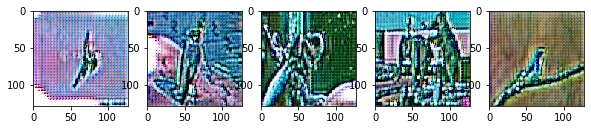

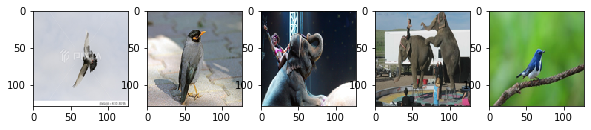

8 	 -2.2809 	 0.5137(0.30) 	 0.0303(0.97) 	 0.0280(0.96)




  0%|          | 0/532 [00:00<?, ?it/s]

  0%|          | 1/532 [00:00<07:23,  1.20it/s]

  0%|          | 2/532 [00:01<06:28,  1.37it/s]

  1%|          | 3/532 [00:01<05:49,  1.51it/s]

  1%|          | 4/532 [00:02<05:22,  1.64it/s]

  1%|          | 5/532 [00:02<05:02,  1.74it/s]

  1%|          | 6/532 [00:03<04:49,  1.82it/s]

  1%|▏         | 7/532 [00:03<04:39,  1.88it/s]

  2%|▏         | 8/532 [00:04<04:33,  1.92it/s]

  2%|▏         | 9/532 [00:04<04:28,  1.95it/s]

  2%|▏         | 10/532 [00:05<04:24,  1.97it/s]

  2%|▏         | 11/532 [00:05<04:22,  1.99it/s]

  2%|▏         | 12/532 [00:06<04:20,  2.00it/s]

  2%|▏         | 13/532 [00:06<04:18,  2.01it/s]

  3%|▎         | 14/532 [00:07<04:17,  2.01it/s]

  3%|▎         | 15/532 [00:07<04:16,  2.01it/s]

  3%|▎         | 16/532 [00:08<04:16,  2.02it/s]

  3%|▎         | 17/532 [00:08<04:15,  2.01it/s]

  3%|▎         | 18/532 [00:09<04:15,  2.01it/s]

  4%|▎         | 19/532 [00:09<04:14,  2.01it/s]

  4%|▍         |

 27%|██▋       | 145/532 [01:13<03:17,  1.96it/s]

 27%|██▋       | 146/532 [01:14<03:17,  1.96it/s]

 28%|██▊       | 147/532 [01:14<03:16,  1.96it/s]

 28%|██▊       | 148/532 [01:15<03:16,  1.96it/s]

 28%|██▊       | 149/532 [01:15<03:15,  1.96it/s]

 28%|██▊       | 150/532 [01:16<03:15,  1.96it/s]

 28%|██▊       | 151/532 [01:16<03:14,  1.96it/s]

 29%|██▊       | 152/532 [01:17<03:14,  1.96it/s]

 29%|██▉       | 153/532 [01:17<03:13,  1.96it/s]

 29%|██▉       | 154/532 [01:18<03:13,  1.96it/s]

 29%|██▉       | 155/532 [01:18<03:12,  1.96it/s]

 29%|██▉       | 156/532 [01:19<03:12,  1.96it/s]

 30%|██▉       | 157/532 [01:19<03:11,  1.96it/s]

 30%|██▉       | 158/532 [01:20<03:11,  1.96it/s]

 30%|██▉       | 159/532 [01:20<03:10,  1.96it/s]

 30%|███       | 160/532 [01:21<03:10,  1.96it/s]

 30%|███       | 161/532 [01:21<03:09,  1.96it/s]

 30%|███       | 162/532 [01:22<03:09,  1.96it/s]

 31%|███       | 163/532 [01:22<03:08,  1.96it/s]

 31%|███       | 164/532 [01:23

 54%|█████▍    | 288/532 [02:26<02:05,  1.95it/s]

 54%|█████▍    | 289/532 [02:27<02:04,  1.95it/s]

 55%|█████▍    | 290/532 [02:27<02:04,  1.95it/s]

 55%|█████▍    | 291/532 [02:28<02:03,  1.95it/s]

 55%|█████▍    | 292/532 [02:28<02:03,  1.95it/s]

 55%|█████▌    | 293/532 [02:29<02:02,  1.95it/s]

 55%|█████▌    | 294/532 [02:29<02:02,  1.95it/s]

 55%|█████▌    | 295/532 [02:30<02:01,  1.95it/s]

 56%|█████▌    | 296/532 [02:30<02:01,  1.95it/s]

 56%|█████▌    | 297/532 [02:31<02:00,  1.95it/s]

 56%|█████▌    | 298/532 [02:31<02:00,  1.95it/s]

 56%|█████▌    | 299/532 [02:32<01:59,  1.95it/s]

 56%|█████▋    | 300/532 [02:32<01:59,  1.95it/s]

 57%|█████▋    | 301/532 [02:33<01:58,  1.95it/s]

 57%|█████▋    | 302/532 [02:33<01:57,  1.95it/s]

 57%|█████▋    | 303/532 [02:34<01:57,  1.95it/s]

 57%|█████▋    | 304/532 [02:34<01:56,  1.95it/s]

 57%|█████▋    | 305/532 [02:35<01:56,  1.95it/s]

 58%|█████▊    | 306/532 [02:36<01:55,  1.95it/s]

 58%|█████▊    | 307/532 [02:36

 81%|████████  | 431/532 [03:40<00:51,  1.95it/s]

 81%|████████  | 432/532 [03:40<00:51,  1.95it/s]

 81%|████████▏ | 433/532 [03:41<00:50,  1.95it/s]

 82%|████████▏ | 434/532 [03:41<00:50,  1.95it/s]

 82%|████████▏ | 435/532 [03:42<00:49,  1.95it/s]

 82%|████████▏ | 436/532 [03:42<00:49,  1.95it/s]

 82%|████████▏ | 437/532 [03:43<00:48,  1.95it/s]

 82%|████████▏ | 438/532 [03:43<00:48,  1.95it/s]

 83%|████████▎ | 439/532 [03:44<00:47,  1.95it/s]

 83%|████████▎ | 440/532 [03:44<00:47,  1.95it/s]

 83%|████████▎ | 441/532 [03:45<00:46,  1.95it/s]

 83%|████████▎ | 442/532 [03:45<00:46,  1.95it/s]

 83%|████████▎ | 443/532 [03:46<00:45,  1.95it/s]

 83%|████████▎ | 444/532 [03:46<00:45,  1.95it/s]

 84%|████████▎ | 445/532 [03:47<00:44,  1.95it/s]

 84%|████████▍ | 446/532 [03:47<00:44,  1.95it/s]

 84%|████████▍ | 447/532 [03:48<00:43,  1.95it/s]

 84%|████████▍ | 448/532 [03:48<00:43,  1.95it/s]

 84%|████████▍ | 449/532 [03:49<00:42,  1.95it/s]

 85%|████████▍ | 450/532 [03:49

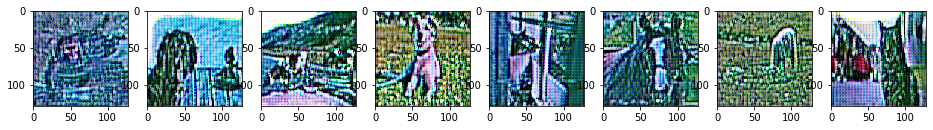

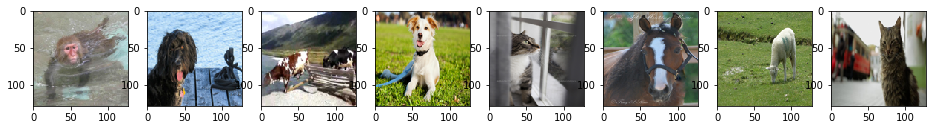



  0%|          | 0/270 [00:00<?, ?it/s]

  0%|          | 1/270 [00:00<01:11,  3.74it/s]

  1%|          | 2/270 [00:00<01:26,  3.10it/s]

  1%|          | 3/270 [00:00<01:14,  3.59it/s]

  1%|▏         | 4/270 [00:01<01:04,  4.14it/s]

  2%|▏         | 5/270 [00:01<00:58,  4.55it/s]

  2%|▏         | 6/270 [00:01<01:21,  3.24it/s]

  3%|▎         | 7/270 [00:01<01:16,  3.44it/s]

  3%|▎         | 8/270 [00:02<01:09,  3.78it/s]

  3%|▎         | 9/270 [00:02<01:00,  4.34it/s]

  4%|▎         | 10/270 [00:02<00:53,  4.83it/s]

  4%|▍         | 11/270 [00:02<00:59,  4.36it/s]

  4%|▍         | 12/270 [00:02<00:54,  4.71it/s]

  5%|▍         | 13/270 [00:03<01:03,  4.05it/s]

  5%|▌         | 14/270 [00:03<01:03,  4.02it/s]

  6%|▌         | 15/270 [00:03<01:15,  3.36it/s]

  6%|▌         | 16/270 [00:04<01:03,  3.98it/s]

  6%|▋         | 17/270 [00:04<00:59,  4.22it/s]

  7%|▋         | 18/270 [00:04<01:00,  4.19it/s]

  7%|▋         | 19/270 [00:04<00:52,  4.80it/s]

  7%|▋         |

 54%|█████▎    | 145/270 [00:39<00:48,  2.57it/s]

 54%|█████▍    | 146/270 [00:39<00:41,  2.99it/s]

 54%|█████▍    | 147/270 [00:40<00:42,  2.87it/s]

 55%|█████▍    | 148/270 [00:40<00:35,  3.46it/s]

 55%|█████▌    | 149/270 [00:40<00:33,  3.57it/s]

 56%|█████▌    | 150/270 [00:40<00:27,  4.36it/s]

 56%|█████▌    | 151/270 [00:41<00:54,  2.20it/s]

 56%|█████▋    | 152/270 [00:42<00:50,  2.32it/s]

 57%|█████▋    | 153/270 [00:42<00:48,  2.42it/s]

 57%|█████▋    | 154/270 [00:42<00:37,  3.05it/s]

 57%|█████▋    | 155/270 [00:42<00:35,  3.25it/s]

 58%|█████▊    | 156/270 [00:43<00:37,  3.02it/s]

 58%|█████▊    | 157/270 [00:43<00:33,  3.33it/s]

 59%|█████▊    | 158/270 [00:44<00:42,  2.65it/s]

 59%|█████▉    | 159/270 [00:44<00:38,  2.86it/s]

 59%|█████▉    | 160/270 [00:44<00:38,  2.88it/s]

 60%|█████▉    | 161/270 [00:44<00:30,  3.56it/s]

 60%|██████    | 162/270 [00:45<00:27,  3.94it/s]

 60%|██████    | 163/270 [00:45<00:25,  4.17it/s]

 61%|██████    | 164/270 [00:46

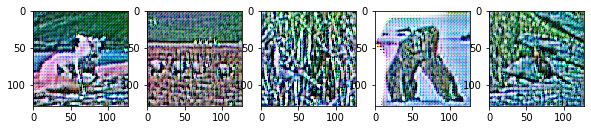

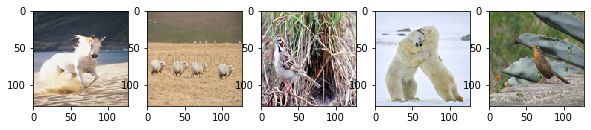

9 	 -2.2587 	 0.5375(0.31) 	 0.0123(0.97) 	 0.1047(0.97)


In [61]:
print('epoch \t encd_train \t 0_valid \t 0_train \t 1_train')
for epoch in range(EPOCHS):
    model_0.train()
    model_1.train()
    net_g.train()
    
    correct_cls = 0 
    total_cls = 0
    correct_cxt = 0
    total_cxt = 0
    for batch_i, batch in tqdm(enumerate(train_loader), total=len(train_loader), leave=False):
        
        # Update Model 0 Discriminator
        optimizer_0.zero_grad()

        imgs = batch['image']
        cls = batch['cls'].to(device)
        cxt = batch['cxt'].to(device)
        batches_done = len(train_loader) * epoch + batch_i
        imgs = Variable(imgs.to(device))
        
        g_imgs = net_g(imgs)
        cls_ = model_0(g_imgs)
        loss_0_train = clsBCE(cls_, cls)
        loss_0_train.backward()
        optimizer_0.step()
            
        _, predicted = torch.max(cls_, 1)
        _, actuals = torch.max(cls, 1)
        correct_cls += (predicted == actuals).sum().item()
        total_cls += cls.shape[0]
        
        # Update Model 1 Discriminator
        optimizer_1.zero_grad()
        
        g_imgs = net_g(imgs)
        cxt_ = model_1(g_imgs)
        loss_1_train = cxtBCE(cxt_, cxt)
        loss_1_train.backward()
        optimizer_1.step()
            
        _, predicted = torch.max(cxt_, 1)
        _, actuals = torch.max(cxt, 1)
        correct_cxt += (predicted == actuals).sum().item()
        total_cxt += cls.shape[0]
        
        # Update Generator
        optimizer_g.zero_grad()
        
        imgs = Variable(imgs.to(device))
        g_imgs = net_g(imgs)
        
        cls_ = model_0(g_imgs)
        cxt_ = model_1(g_imgs)
        loss_0 = clsBCE(cls_, cls)
        loss_1 = cxtBCE(cxt_, cxt)
        loss_g_train = loss_0 + ALPHA * (loss_1 - EPSILON)
        loss_g_train.backward()
        optimizer_g.step()
        
    h_train_acc_0.append(correct_cls/total_cls)
    h_train_acc_1.append(correct_cxt/total_cxt)
    
    g_imgs = g_imgs.cpu().detach().numpy()
    fig = plt.figure(figsize=(16, 6))
    count = 0
    for img in g_imgs.transpose(0, 2, 3, 1):
        ax = fig.add_subplot(181+count)
        count += 1
        plt.imshow(img)
        if count >= 8:
            break
    plt.show()

    imgs = imgs.cpu().detach().numpy()
    fig = plt.figure(figsize=(16, 6))
    count = 0
    for img in imgs.transpose(0, 2, 3, 1):
        ax = fig.add_subplot(181+count)
        count += 1
        plt.imshow(img)
        if count >= 8:
            break
    plt.show()


    if epoch % 1 == 0:        
        vloss_0 = 0
        bcount = 0
        
        correct = 0
        total = 0
        
        for batch_i, batch in tqdm(enumerate(valid_loader), total=len(valid_loader), leave=False):
            imgs = batch['image']
            cls = batch['cls'].to(device)
            cxt = batch['cxt'].to(device)
                
            imgs = Variable(imgs.to(device))        
            g_imgs = net_g(imgs)
            cls_ = model_0(g_imgs)
            cxt_ = model_1(g_imgs)
            loss_0 = _BCE(cls_, cls)
            
            _, predicted = torch.max(cls_, 1)
            _, actuals = torch.max(cls, 1)
            correct += (predicted == actuals).sum().item()
            total += cls.shape[0]
            
            bcount += 1 
            vloss_0 += loss_0.item()
            
        h_valid_acc_0.append(correct/total)

        g_imgs = g_imgs.cpu().detach().numpy()
        fig = plt.figure(figsize=(16, 6))
        count = 0
        for img in g_imgs.transpose(0, 2, 3, 1):
            ax = fig.add_subplot(181+count)
            count += 1
            plt.imshow(img)
            if count >= 8:
                break
        plt.show()

        imgs = imgs.cpu().detach().numpy()
        fig = plt.figure(figsize=(16, 6))
        count = 0
        for img in imgs.transpose(0, 2, 3, 1):
            ax = fig.add_subplot(181+count)
            count += 1
            plt.imshow(img)
            if count >= 8:
                break
        plt.show()

        
        if h_valid_acc_0[-1] > ACC_BEST:
            print('Saving Best...')
            ACC_BEST = h_valid_acc_0[-1]
            torch.save(net_g, 'nico_generator_best.pkl')
                            
        print('{} \t {:.4f} \t {:.4f}({:.2f}) \t {:.4f}({:.2f}) \t {:.4f}({:.2f})'.format(
            epoch, loss_g_train.item(),
            vloss_0/bcount, h_valid_acc_0[-1],
            loss_0_train.item(), h_train_acc_0[-1],
            loss_1_train.item(), h_train_acc_1[-1]
        ))

        h_epochs.append(epoch)
        h_train_losses_g.append(loss_g_train.item())
        h_valid_losses_0.append(vloss_0/bcount)
        h_train_losses_0.append(loss_0_train.item())
        h_train_losses_1.append(loss_1_train.item())

# Encoding Check

In [62]:
net_g = torch.load('./nico_generator_best.pkl')

In [63]:
print('epoch \t 0_valid \t 0_train')
for epoch in range(EPOCHS):
    model_0.train()
    
    correct = 0 
    total = 0
    for batch_i, batch in tqdm(enumerate(train_loader), total=len(train_loader), leave=False):
        imgs = batch['image']
        cls = batch['cls'].to(device)
        imgs = Variable(imgs.to(device))
        
        g_imgs = net_g(imgs)
        cls_ = model_0(g_imgs)
        loss_0_train = _BCE(cls_, cls)
        optimizer_0.zero_grad()
        loss_0_train.backward()
        optimizer_0.step()
            
        _, predicted = torch.max(cls_, 1)
        _, actuals = torch.max(cls, 1)
        correct += (predicted == actuals).sum().item()
        total += cls.shape[0]
        
    h_train_acc_0.append(correct/total)

    model_0.eval()
        
    if epoch % 1 == 0:        
        model_0.eval()
        
        vloss_0 = 0
        bcount = 0
        
        correct = 0
        total = 0
        
        batch_show = np.random.randint(0, len(valid_loader))
        for batch_i, batch in tqdm(enumerate(valid_loader), total=len(valid_loader), leave=False):
            imgs = batch['image']
            cls = batch['cls'].to(device)
                
            imgs = Variable(imgs.to(device))        
            g_imgs = net_g(imgs)
            cls_ = model_0(g_imgs)
            loss_0 = _BCE(cls_, cls)
            
            _, predicted = torch.max(cls_, 1)
            _, actuals = torch.max(cls, 1)
            correct += (predicted == actuals).sum().item()
            total += cls.shape[0]
            
            bcount += 1 
            vloss_0 += loss_0.item()

        h_valid_acc_0.append(correct/total)
                            
        print('{} \t {:.4f}({:.2f}) \t {:.4f}({:.2f})'.format(
            epoch, 
            vloss_0/bcount, h_valid_acc_0[-1],
            loss_0_train.item(), h_train_acc_0[-1],
        ))

        h_epochs.append(epoch)
        h_valid_losses_0.append(vloss_0/bcount)
        h_train_losses_0.append(loss_0_train.item())

epoch 	 0_valid 	 0_train




  0%|          | 0/532 [00:00<?, ?it/s]

  0%|          | 1/532 [00:00<05:06,  1.73it/s]

  0%|          | 2/532 [00:00<04:07,  2.14it/s]

  1%|          | 3/532 [00:00<03:22,  2.61it/s]

  1%|          | 4/532 [00:01<03:54,  2.25it/s]

  1%|          | 5/532 [00:01<03:42,  2.37it/s]

  1%|          | 6/532 [00:02<03:29,  2.51it/s]

  1%|▏         | 7/532 [00:02<03:01,  2.89it/s]

  2%|▏         | 8/532 [00:02<03:19,  2.63it/s]

  2%|▏         | 9/532 [00:03<02:44,  3.17it/s]

  2%|▏         | 10/532 [00:03<02:35,  3.35it/s]

  2%|▏         | 11/532 [00:03<02:28,  3.52it/s]

  2%|▏         | 12/532 [00:03<02:31,  3.44it/s]

  2%|▏         | 13/532 [00:04<03:06,  2.78it/s]

  3%|▎         | 14/532 [00:04<02:52,  3.01it/s]

  3%|▎         | 15/532 [00:04<02:27,  3.50it/s]

  3%|▎         | 16/532 [00:05<02:59,  2.87it/s]

  3%|▎         | 17/532 [00:05<02:43,  3.15it/s]

  3%|▎         | 18/532 [00:05<02:19,  3.69it/s]

  4%|▎         | 19/532 [00:06<02:22,  3.59it/s]

  4%|▍         |

 27%|██▋       | 145/532 [00:37<01:35,  4.06it/s]

 27%|██▋       | 146/532 [00:37<01:25,  4.50it/s]

 28%|██▊       | 147/532 [00:37<01:19,  4.85it/s]

 28%|██▊       | 148/532 [00:38<01:27,  4.38it/s]

 28%|██▊       | 149/532 [00:38<01:24,  4.51it/s]

 28%|██▊       | 150/532 [00:38<01:40,  3.79it/s]

 28%|██▊       | 151/532 [00:38<01:55,  3.30it/s]

 29%|██▊       | 152/532 [00:39<01:39,  3.82it/s]

 29%|██▉       | 153/532 [00:39<01:30,  4.20it/s]

 29%|██▉       | 154/532 [00:39<01:37,  3.88it/s]

 29%|██▉       | 155/532 [00:39<01:28,  4.27it/s]

 29%|██▉       | 156/532 [00:40<01:46,  3.53it/s]

 30%|██▉       | 157/532 [00:40<01:50,  3.38it/s]

 30%|██▉       | 158/532 [00:40<01:36,  3.87it/s]

 30%|██▉       | 159/532 [00:40<01:38,  3.79it/s]

 30%|███       | 160/532 [00:41<01:48,  3.43it/s]

 30%|███       | 161/532 [00:41<01:49,  3.38it/s]

 30%|███       | 162/532 [00:41<01:40,  3.69it/s]

 31%|███       | 163/532 [00:42<01:28,  4.17it/s]

 31%|███       | 164/532 [00:42

 54%|█████▍    | 288/532 [01:12<01:11,  3.41it/s]

 54%|█████▍    | 289/532 [01:13<01:02,  3.91it/s]

 55%|█████▍    | 290/532 [01:13<01:00,  3.98it/s]

 55%|█████▍    | 291/532 [01:13<00:57,  4.16it/s]

 55%|█████▍    | 292/532 [01:13<00:57,  4.20it/s]

 55%|█████▌    | 293/532 [01:13<00:51,  4.60it/s]

 55%|█████▌    | 294/532 [01:14<00:49,  4.78it/s]

 55%|█████▌    | 295/532 [01:14<00:46,  5.07it/s]

 56%|█████▌    | 296/532 [01:14<00:45,  5.22it/s]

 56%|█████▌    | 297/532 [01:14<00:43,  5.40it/s]

 56%|█████▌    | 298/532 [01:14<00:42,  5.50it/s]

 56%|█████▌    | 299/532 [01:15<01:05,  3.54it/s]

 56%|█████▋    | 300/532 [01:15<01:05,  3.52it/s]

 57%|█████▋    | 301/532 [01:15<00:57,  4.01it/s]

 57%|█████▋    | 302/532 [01:15<00:51,  4.44it/s]

 57%|█████▋    | 303/532 [01:16<01:07,  3.41it/s]

 57%|█████▋    | 304/532 [01:16<01:00,  3.78it/s]

 57%|█████▋    | 305/532 [01:16<01:05,  3.48it/s]

 58%|█████▊    | 306/532 [01:17<01:04,  3.50it/s]

 58%|█████▊    | 307/532 [01:17

 81%|████████  | 431/532 [01:52<00:32,  3.14it/s]

 81%|████████  | 432/532 [01:53<00:30,  3.32it/s]

 81%|████████▏ | 433/532 [01:53<00:25,  3.82it/s]

 82%|████████▏ | 434/532 [01:53<00:22,  4.28it/s]

 82%|████████▏ | 435/532 [01:53<00:21,  4.60it/s]

 82%|████████▏ | 436/532 [01:53<00:19,  4.82it/s]

 82%|████████▏ | 437/532 [01:54<00:32,  2.88it/s]

 82%|████████▏ | 438/532 [01:54<00:34,  2.70it/s]

 83%|████████▎ | 439/532 [01:55<00:37,  2.50it/s]

 83%|████████▎ | 440/532 [01:55<00:30,  3.03it/s]

 83%|████████▎ | 441/532 [01:56<00:32,  2.81it/s]

 83%|████████▎ | 442/532 [01:56<00:28,  3.17it/s]

 83%|████████▎ | 443/532 [01:56<00:24,  3.68it/s]

 83%|████████▎ | 444/532 [01:56<00:23,  3.73it/s]

 84%|████████▎ | 445/532 [01:57<00:25,  3.41it/s]

 84%|████████▍ | 446/532 [01:57<00:26,  3.21it/s]

 84%|████████▍ | 447/532 [01:57<00:28,  2.94it/s]

 84%|████████▍ | 448/532 [01:58<00:30,  2.72it/s]

 84%|████████▍ | 449/532 [01:58<00:25,  3.22it/s]

 85%|████████▍ | 450/532 [01:58

 15%|█▌        | 41/270 [00:09<00:58,  3.94it/s]

 16%|█▌        | 42/270 [00:09<00:57,  3.97it/s]

 16%|█▌        | 43/270 [00:10<01:16,  2.96it/s]

 16%|█▋        | 44/270 [00:10<01:11,  3.16it/s]

 17%|█▋        | 45/270 [00:10<01:11,  3.16it/s]

 17%|█▋        | 46/270 [00:11<01:09,  3.20it/s]

 17%|█▋        | 47/270 [00:11<01:08,  3.27it/s]

 18%|█▊        | 48/270 [00:11<00:55,  4.03it/s]

 18%|█▊        | 49/270 [00:11<00:54,  4.08it/s]

 19%|█▊        | 50/270 [00:11<00:48,  4.56it/s]

 19%|█▉        | 51/270 [00:12<00:44,  4.98it/s]

 19%|█▉        | 52/270 [00:12<01:16,  2.84it/s]

 20%|█▉        | 53/270 [00:13<01:07,  3.21it/s]

 20%|██        | 55/270 [00:13<00:52,  4.07it/s]

 21%|██        | 56/270 [00:13<00:47,  4.53it/s]

 21%|██        | 57/270 [00:13<00:47,  4.44it/s]

 21%|██▏       | 58/270 [00:13<00:45,  4.71it/s]

 22%|██▏       | 59/270 [00:13<00:38,  5.48it/s]

 22%|██▏       | 60/270 [00:14<00:35,  5.85it/s]

 23%|██▎       | 61/270 [00:14<00:41,  5.05it/s]



 69%|██████▉   | 187/270 [00:49<00:22,  3.65it/s]

 70%|██████▉   | 188/270 [00:49<00:23,  3.56it/s]

 70%|███████   | 189/270 [00:49<00:20,  3.91it/s]

 70%|███████   | 190/270 [00:49<00:17,  4.68it/s]

 71%|███████   | 191/270 [00:49<00:16,  4.73it/s]

 71%|███████   | 192/270 [00:50<00:14,  5.22it/s]

 71%|███████▏  | 193/270 [00:50<00:14,  5.31it/s]

 72%|███████▏  | 194/270 [00:50<00:16,  4.61it/s]

 72%|███████▏  | 195/270 [00:50<00:16,  4.65it/s]

 73%|███████▎  | 196/270 [00:51<00:18,  4.04it/s]

 73%|███████▎  | 197/270 [00:51<00:15,  4.68it/s]

 73%|███████▎  | 198/270 [00:51<00:14,  5.04it/s]

 74%|███████▎  | 199/270 [00:52<00:32,  2.17it/s]

 74%|███████▍  | 200/270 [00:52<00:26,  2.64it/s]

 74%|███████▍  | 201/270 [00:52<00:22,  3.12it/s]

 75%|███████▍  | 202/270 [00:53<00:20,  3.38it/s]

 75%|███████▌  | 203/270 [00:53<00:17,  3.82it/s]

 76%|███████▌  | 204/270 [00:53<00:16,  4.00it/s]

 76%|███████▌  | 205/270 [00:53<00:17,  3.67it/s]

 76%|███████▋  | 206/270 [00:54

0 	 0.4813(0.31) 	 0.0139(0.97)




  0%|          | 0/532 [00:00<?, ?it/s]

  0%|          | 1/532 [00:00<02:38,  3.34it/s]

  0%|          | 2/532 [00:00<02:17,  3.86it/s]

  1%|          | 3/532 [00:00<02:18,  3.81it/s]

  1%|          | 4/532 [00:01<03:04,  2.86it/s]

  1%|          | 5/532 [00:01<02:51,  3.08it/s]

  1%|          | 6/532 [00:02<03:11,  2.74it/s]

  1%|▏         | 7/532 [00:02<02:49,  3.09it/s]

  2%|▏         | 8/532 [00:02<02:44,  3.19it/s]

  2%|▏         | 9/532 [00:02<02:28,  3.53it/s]

  2%|▏         | 10/532 [00:02<02:09,  4.04it/s]

  2%|▏         | 11/532 [00:03<01:56,  4.48it/s]

  2%|▏         | 12/532 [00:03<02:07,  4.07it/s]

  2%|▏         | 13/532 [00:03<02:17,  3.78it/s]

  3%|▎         | 14/532 [00:03<02:01,  4.26it/s]

  3%|▎         | 15/532 [00:04<02:10,  3.95it/s]

  3%|▎         | 16/532 [00:04<02:54,  2.95it/s]

  3%|▎         | 17/532 [00:04<02:46,  3.09it/s]

  3%|▎         | 18/532 [00:05<02:53,  2.96it/s]

  4%|▎         | 19/532 [00:05<03:22,  2.53it/s]

  4%|▍         |

 27%|██▋       | 145/532 [00:37<02:13,  2.89it/s]

 27%|██▋       | 146/532 [00:37<01:52,  3.42it/s]

 28%|██▊       | 147/532 [00:38<02:15,  2.84it/s]

 28%|██▊       | 148/532 [00:38<01:55,  3.32it/s]

 28%|██▊       | 149/532 [00:38<01:47,  3.55it/s]

 28%|██▊       | 150/532 [00:39<01:37,  3.93it/s]

 28%|██▊       | 151/532 [00:39<01:27,  4.36it/s]

 29%|██▊       | 152/532 [00:39<01:36,  3.95it/s]

 29%|██▉       | 153/532 [00:39<01:28,  4.27it/s]

 29%|██▉       | 154/532 [00:40<01:47,  3.50it/s]

 29%|██▉       | 155/532 [00:40<01:46,  3.54it/s]

 29%|██▉       | 156/532 [00:40<01:33,  4.04it/s]

 30%|██▉       | 157/532 [00:40<01:26,  4.33it/s]

 30%|██▉       | 158/532 [00:40<01:19,  4.69it/s]

 30%|██▉       | 159/532 [00:41<01:39,  3.74it/s]

 30%|███       | 160/532 [00:41<01:51,  3.34it/s]

 30%|███       | 161/532 [00:42<01:51,  3.32it/s]

 30%|███       | 162/532 [00:42<02:13,  2.78it/s]

 31%|███       | 163/532 [00:42<01:51,  3.30it/s]

 31%|███       | 164/532 [00:42

 54%|█████▍    | 288/532 [01:15<01:26,  2.83it/s]

 54%|█████▍    | 289/532 [01:15<01:12,  3.35it/s]

 55%|█████▍    | 290/532 [01:16<01:23,  2.91it/s]

 55%|█████▍    | 291/532 [01:16<01:27,  2.74it/s]

 55%|█████▍    | 292/532 [01:16<01:22,  2.92it/s]

 55%|█████▌    | 293/532 [01:17<01:17,  3.08it/s]

 55%|█████▌    | 294/532 [01:17<01:24,  2.80it/s]

 55%|█████▌    | 295/532 [01:17<01:21,  2.92it/s]

 56%|█████▌    | 296/532 [01:18<01:18,  3.00it/s]

 56%|█████▌    | 297/532 [01:18<01:32,  2.55it/s]

 56%|█████▌    | 298/532 [01:18<01:21,  2.89it/s]

 56%|█████▌    | 299/532 [01:19<01:37,  2.40it/s]

 56%|█████▋    | 300/532 [01:19<01:44,  2.23it/s]

 57%|█████▋    | 301/532 [01:20<01:25,  2.70it/s]

 57%|█████▋    | 302/532 [01:20<01:14,  3.08it/s]

 57%|█████▋    | 303/532 [01:20<01:03,  3.59it/s]

 57%|█████▋    | 304/532 [01:20<01:00,  3.76it/s]

 57%|█████▋    | 305/532 [01:20<00:53,  4.22it/s]

 58%|█████▊    | 306/532 [01:21<01:01,  3.70it/s]

 58%|█████▊    | 307/532 [01:21

 81%|████████  | 431/532 [01:54<00:24,  4.06it/s]

 81%|████████  | 432/532 [01:55<00:26,  3.71it/s]

 81%|████████▏ | 433/532 [01:55<00:25,  3.94it/s]

 82%|████████▏ | 434/532 [01:55<00:22,  4.39it/s]

 82%|████████▏ | 435/532 [01:55<00:21,  4.53it/s]

 82%|████████▏ | 436/532 [01:55<00:20,  4.69it/s]

 82%|████████▏ | 437/532 [01:56<00:20,  4.69it/s]

 82%|████████▏ | 438/532 [01:56<00:18,  5.00it/s]

 83%|████████▎ | 439/532 [01:56<00:20,  4.51it/s]

 83%|████████▎ | 440/532 [01:56<00:20,  4.58it/s]

 83%|████████▎ | 441/532 [01:57<00:24,  3.77it/s]

 83%|████████▎ | 442/532 [01:57<00:23,  3.75it/s]

 83%|████████▎ | 443/532 [01:57<00:21,  4.21it/s]

 83%|████████▎ | 444/532 [01:57<00:19,  4.46it/s]

 84%|████████▎ | 445/532 [01:57<00:18,  4.72it/s]

 84%|████████▍ | 446/532 [01:58<00:18,  4.60it/s]

 84%|████████▍ | 447/532 [01:58<00:25,  3.29it/s]

 84%|████████▍ | 448/532 [01:58<00:22,  3.78it/s]

 84%|████████▍ | 449/532 [01:58<00:20,  4.08it/s]

 85%|████████▍ | 450/532 [01:59

 16%|█▌        | 43/270 [00:11<00:57,  3.98it/s]

 16%|█▋        | 44/270 [00:11<00:53,  4.24it/s]

 17%|█▋        | 45/270 [00:11<01:05,  3.43it/s]

 17%|█▋        | 46/270 [00:12<01:04,  3.47it/s]

 17%|█▋        | 47/270 [00:12<00:55,  4.02it/s]

 18%|█▊        | 48/270 [00:12<01:11,  3.09it/s]

 18%|█▊        | 49/270 [00:13<01:23,  2.65it/s]

 19%|█▊        | 50/270 [00:13<01:24,  2.59it/s]

 19%|█▉        | 51/270 [00:13<01:14,  2.94it/s]

 19%|█▉        | 52/270 [00:14<01:17,  2.81it/s]

 20%|█▉        | 53/270 [00:14<01:06,  3.26it/s]

 20%|██        | 54/270 [00:14<01:05,  3.30it/s]

 20%|██        | 55/270 [00:14<00:58,  3.69it/s]

 21%|██        | 56/270 [00:15<00:49,  4.37it/s]

 21%|██        | 57/270 [00:15<00:54,  3.91it/s]

 21%|██▏       | 58/270 [00:15<01:05,  3.21it/s]

 22%|██▏       | 59/270 [00:16<01:01,  3.42it/s]

 22%|██▏       | 60/270 [00:16<00:53,  3.91it/s]

 23%|██▎       | 61/270 [00:16<00:59,  3.49it/s]

 23%|██▎       | 62/270 [00:16<00:50,  4.13it/s]



 70%|███████   | 190/270 [00:51<00:31,  2.52it/s]

 71%|███████   | 191/270 [00:52<00:28,  2.76it/s]

 71%|███████   | 192/270 [00:52<00:24,  3.21it/s]

 71%|███████▏  | 193/270 [00:52<00:30,  2.52it/s]

 72%|███████▏  | 194/270 [00:53<00:27,  2.76it/s]

 72%|███████▏  | 195/270 [00:53<00:25,  2.91it/s]

 73%|███████▎  | 196/270 [00:54<00:30,  2.41it/s]

 73%|███████▎  | 197/270 [00:54<00:26,  2.78it/s]

 73%|███████▎  | 198/270 [00:54<00:22,  3.14it/s]

 74%|███████▎  | 199/270 [00:54<00:20,  3.40it/s]

 74%|███████▍  | 200/270 [00:55<00:19,  3.52it/s]

 74%|███████▍  | 201/270 [00:55<00:18,  3.66it/s]

 75%|███████▍  | 202/270 [00:55<00:16,  4.13it/s]

 75%|███████▌  | 203/270 [00:55<00:14,  4.52it/s]

 76%|███████▌  | 204/270 [00:55<00:12,  5.10it/s]

 76%|███████▌  | 205/270 [00:55<00:12,  5.38it/s]

 76%|███████▋  | 206/270 [00:56<00:12,  4.99it/s]

 77%|███████▋  | 208/270 [00:56<00:11,  5.21it/s]

 77%|███████▋  | 209/270 [00:56<00:12,  5.08it/s]

 78%|███████▊  | 210/270 [00:57

1 	 0.5239(0.27) 	 0.0150(0.98)




  0%|          | 0/532 [00:00<?, ?it/s]

  0%|          | 1/532 [00:00<03:26,  2.57it/s]

  0%|          | 2/532 [00:00<03:45,  2.36it/s]

  1%|          | 3/532 [00:01<03:03,  2.88it/s]

  1%|          | 4/532 [00:01<02:34,  3.42it/s]

  1%|          | 5/532 [00:01<02:16,  3.86it/s]

  1%|          | 6/532 [00:01<02:01,  4.34it/s]

  1%|▏         | 7/532 [00:01<01:50,  4.74it/s]

  2%|▏         | 8/532 [00:01<01:57,  4.44it/s]

  2%|▏         | 9/532 [00:02<01:54,  4.58it/s]

  2%|▏         | 10/532 [00:02<01:53,  4.60it/s]

  2%|▏         | 11/532 [00:02<01:48,  4.81it/s]

  2%|▏         | 12/532 [00:02<02:07,  4.07it/s]

  2%|▏         | 13/532 [00:03<01:57,  4.42it/s]

  3%|▎         | 14/532 [00:03<01:49,  4.75it/s]

  3%|▎         | 15/532 [00:03<02:19,  3.71it/s]

  3%|▎         | 16/532 [00:03<02:02,  4.20it/s]

  3%|▎         | 17/532 [00:04<01:51,  4.61it/s]

  3%|▎         | 18/532 [00:04<01:43,  4.98it/s]

  4%|▎         | 19/532 [00:04<01:37,  5.26it/s]

  4%|▍         |

 27%|██▋       | 145/532 [00:36<02:22,  2.71it/s]

 27%|██▋       | 146/532 [00:36<01:59,  3.24it/s]

 28%|██▊       | 147/532 [00:36<01:42,  3.76it/s]

 28%|██▊       | 148/532 [00:36<02:17,  2.80it/s]

 28%|██▊       | 149/532 [00:37<01:56,  3.29it/s]

 28%|██▊       | 150/532 [00:37<01:59,  3.20it/s]

 28%|██▊       | 151/532 [00:37<01:45,  3.63it/s]

 29%|██▊       | 152/532 [00:37<01:37,  3.88it/s]

 29%|██▉       | 153/532 [00:38<02:25,  2.60it/s]

 29%|██▉       | 154/532 [00:38<02:02,  3.08it/s]

 29%|██▉       | 155/532 [00:39<03:09,  1.99it/s]

 29%|██▉       | 156/532 [00:39<02:38,  2.37it/s]

 30%|██▉       | 157/532 [00:40<02:12,  2.84it/s]

 30%|██▉       | 158/532 [00:40<01:54,  3.26it/s]

 30%|██▉       | 159/532 [00:40<02:00,  3.11it/s]

 30%|███       | 160/532 [00:40<01:42,  3.63it/s]

 30%|███       | 161/532 [00:41<01:56,  3.20it/s]

 30%|███       | 162/532 [00:41<01:39,  3.72it/s]

 31%|███       | 163/532 [00:41<01:27,  4.19it/s]

 31%|███       | 164/532 [00:41

 54%|█████▍    | 288/532 [01:15<00:55,  4.39it/s]

 54%|█████▍    | 289/532 [01:15<00:52,  4.60it/s]

 55%|█████▍    | 290/532 [01:15<00:49,  4.94it/s]

 55%|█████▍    | 291/532 [01:16<00:50,  4.77it/s]

 55%|█████▍    | 292/532 [01:16<00:49,  4.84it/s]

 55%|█████▌    | 293/532 [01:16<00:54,  4.36it/s]

 55%|█████▌    | 294/532 [01:16<00:50,  4.73it/s]

 55%|█████▌    | 295/532 [01:17<01:20,  2.96it/s]

 56%|█████▌    | 296/532 [01:17<01:07,  3.48it/s]

 56%|█████▌    | 297/532 [01:18<01:36,  2.45it/s]

 56%|█████▌    | 298/532 [01:18<01:29,  2.60it/s]

 56%|█████▌    | 299/532 [01:18<01:14,  3.12it/s]

 56%|█████▋    | 300/532 [01:19<01:17,  2.99it/s]

 57%|█████▋    | 301/532 [01:19<01:06,  3.46it/s]

 57%|█████▋    | 302/532 [01:19<00:59,  3.87it/s]

 57%|█████▋    | 303/532 [01:19<00:55,  4.12it/s]

 57%|█████▋    | 304/532 [01:19<00:51,  4.42it/s]

 57%|█████▋    | 305/532 [01:20<00:48,  4.72it/s]

 58%|█████▊    | 306/532 [01:20<01:00,  3.72it/s]

 58%|█████▊    | 307/532 [01:20

 81%|████████  | 431/532 [01:55<00:35,  2.84it/s]

 81%|████████  | 432/532 [01:55<00:31,  3.22it/s]

 81%|████████▏ | 433/532 [01:55<00:30,  3.22it/s]

 82%|████████▏ | 434/532 [01:56<00:32,  3.00it/s]

 82%|████████▏ | 435/532 [01:56<00:34,  2.80it/s]

 82%|████████▏ | 436/532 [01:56<00:28,  3.32it/s]

 82%|████████▏ | 437/532 [01:57<00:31,  3.01it/s]

 82%|████████▏ | 438/532 [01:57<00:28,  3.25it/s]

 83%|████████▎ | 439/532 [01:57<00:29,  3.11it/s]

 83%|████████▎ | 440/532 [01:58<00:38,  2.38it/s]

 83%|████████▎ | 441/532 [01:58<00:34,  2.61it/s]

 83%|████████▎ | 442/532 [01:59<00:33,  2.69it/s]

 83%|████████▎ | 443/532 [01:59<00:27,  3.20it/s]

 83%|████████▎ | 444/532 [01:59<00:27,  3.16it/s]

 84%|████████▎ | 445/532 [01:59<00:23,  3.67it/s]

 84%|████████▍ | 446/532 [01:59<00:20,  4.14it/s]

 84%|████████▍ | 447/532 [02:00<00:18,  4.55it/s]

 84%|████████▍ | 448/532 [02:00<00:18,  4.50it/s]

 84%|████████▍ | 449/532 [02:00<00:20,  4.07it/s]

 85%|████████▍ | 450/532 [02:00

KeyboardInterrupt: 

In [21]:
print('epoch \t 0_valid \t 0_train')
for epoch in range(EPOCHS):
    model_0.train()
    
    correct = 0 
    total = 0
    for batch_i, batch in tqdm(enumerate(train_loader), total=len(train_loader), leave=False):
        imgs = batch['image']
        cls = batch['cls'].to(device)
        imgs = Variable(imgs.to(device))
        
        g_imgs = imgs
        cls_ = model_0(g_imgs)
        loss_0_train = _BCE(cls_, cls)
        optimizer_0.zero_grad()
        loss_0_train.backward()
        optimizer_0.step()
            
        _, predicted = torch.max(cls_, 1)
        _, actuals = torch.max(cls, 1)
        correct += (predicted == actuals).sum().item()
        total += cls.shape[0]
        
    h_train_acc_0.append(correct/total)

    model_0.eval()
        
    if epoch % 1 == 0:        
        model_0.eval()
        
        vloss_0 = 0
        bcount = 0
        
        correct = 0
        total = 0
        
        batch_show = np.random.randint(0, len(valid_loader))
        for batch_i, batch in tqdm(enumerate(valid_loader), total=len(valid_loader), leave=False):
            imgs = batch['image']
            cls = batch['cls'].to(device)
                
            imgs = Variable(imgs.to(device))        
            g_imgs = imgs
            cls_ = model_0(g_imgs)
            loss_0 = _BCE(cls_, cls)
            
            _, predicted = torch.max(cls_, 1)
            _, actuals = torch.max(cls, 1)
            correct += (predicted == actuals).sum().item()
            total += cls.shape[0]
            
            bcount += 1 
            vloss_0 += loss_0.item()

        h_valid_acc_0.append(correct/total)
                            
        print('{} \t {:.4f}({:.2f}) \t {:.4f}({:.2f})'.format(
            epoch, 
            vloss_0/bcount, h_valid_acc_0[-1],
            loss_0_train.item(), h_train_acc_0[-1],
        ))

        h_epochs.append(epoch)
        h_valid_losses_0.append(vloss_0/bcount)
        h_train_losses_0.append(loss_0_train.item())

epoch 	 0_valid 	 0_train


0 	 0.3406(0.20) 	 0.3111(0.25)


1 	 0.3065(0.31) 	 0.2953(0.34)


2 	 0.2832(0.35) 	 0.2000(0.40)


3 	 0.3035(0.34) 	 0.2575(0.46)


4 	 0.2829(0.37) 	 0.2342(0.52)


5 	 0.3516(0.30) 	 0.1587(0.58)


6 	 0.2872(0.43) 	 0.1317(0.66)


7 	 0.2701(0.48) 	 0.1222(0.74)


8 	 0.3637(0.39) 	 0.1010(0.82)


9 	 0.3387(0.44) 	 0.0685(0.88)


10 	 0.3951(0.41) 	 0.0110(0.92)


11 	 0.4641(0.37) 	 0.0457(0.94)


12 	 0.4564(0.40) 	 0.0462(0.94)


13 	 0.4766(0.38) 	 0.0631(0.95)


14 	 0.4490(0.40) 	 0.0395(0.96)


15 	 0.4943(0.38) 	 0.0263(0.97)


16 	 0.5147(0.38) 	 0.0069(0.96)


17 	 0.4933(0.38) 	 0.0715(0.97)


18 	 0.5014(0.38) 	 0.0092(0.96)


19 	 0.5060(0.38) 	 0.0086(0.97)


20 	 0.4954(0.38) 	 0.0062(0.96)


21 	 0.5405(0.35) 	 0.0205(0.97)


22 	 0.5575(0.36) 	 0.0773(0.98)


23 	 0.6095(0.32) 	 0.0422(0.98)


24 	 0.5541(0.36) 	 0.0053(0.98)


25 	 0.5614(0.38) 	 0.0153(0.98)


26 	 0.5243(0.37) 	 0.0237(0.98)


27 	 0.5496(0.37) 	 0.0229(0.98)


28 	 0.5622(0.38) 	 0.0085(0.98)


29 	 0.4866(0.43) 	 0.0230(0.98)


30 	 0.5739(0.37) 	 0.0095(0.98)


31 	 0.5552(0.37) 	 0.0084(0.98)


32 	 0.5469(0.38) 	 0.0223(0.99)


33 	 0.5497(0.38) 	 0.0086(0.98)


34 	 0.5618(0.37) 	 0.0056(0.98)


35 	 0.5657(0.38) 	 0.0063(0.98)


36 	 0.5551(0.39) 	 0.0802(0.98)


37 	 0.5412(0.40) 	 0.0229(0.99)


38 	 0.5851(0.38) 	 0.0087(0.99)


39 	 0.6030(0.38) 	 0.0602(0.98)


40 	 0.5513(0.39) 	 0.0030(0.98)


41 	 0.6196(0.34) 	 0.0054(0.99)


42 	 0.6009(0.38) 	 0.0047(0.99)


43 	 0.5998(0.38) 	 0.0156(0.98)


44 	 0.5309(0.41) 	 0.0040(0.98)


45 	 0.6126(0.38) 	 0.0020(0.99)


46 	 0.6068(0.36) 	 0.0079(0.99)


47 	 0.5892(0.38) 	 0.0103(0.99)


48 	 0.6124(0.36) 	 0.0008(0.99)


49 	 0.5859(0.39) 	 0.0068(0.98)


50 	 0.5542(0.39) 	 0.0023(0.99)


51 	 0.5371(0.42) 	 0.0003(1.00)


52 	 0.6398(0.36) 	 0.0047(0.98)


53 	 0.5851(0.39) 	 0.0282(0.99)


54 	 0.5672(0.39) 	 0.0006(0.99)


55 	 0.6221(0.36) 	 0.0111(0.99)


56 	 0.5538(0.40) 	 0.0006(0.99)


57 	 0.6217(0.38) 	 0.0110(0.99)


58 	 0.5954(0.38) 	 0.0420(0.98)


59 	 0.6122(0.37) 	 0.0014(0.99)


60 	 0.5950(0.38) 	 0.0209(0.99)


61 	 0.6881(0.35) 	 0.0100(0.99)


62 	 0.5458(0.41) 	 0.0084(0.98)


63 	 0.5726(0.39) 	 0.0000(1.00)


64 	 0.6080(0.40) 	 0.0005(1.00)


65 	 0.6085(0.39) 	 0.0003(0.99)


66 	 0.6183(0.36) 	 0.0022(0.99)


67 	 0.5620(0.41) 	 0.0011(1.00)


68 	 0.6349(0.38) 	 0.0014(1.00)


69 	 0.5692(0.42) 	 0.0005(0.98)


70 	 0.5367(0.42) 	 0.0003(0.99)


71 	 0.5824(0.41) 	 0.0224(0.99)


72 	 0.6171(0.39) 	 0.0005(1.00)


73 	 0.6017(0.39) 	 0.0017(0.98)


74 	 0.6011(0.39) 	 0.0074(0.99)


75 	 0.5898(0.41) 	 0.0002(1.00)


76 	 0.5922(0.41) 	 0.0031(0.99)


77 	 0.6038(0.38) 	 0.0001(1.00)


78 	 0.5587(0.42) 	 0.0004(0.99)


79 	 0.6294(0.38) 	 0.0004(0.99)


80 	 0.6258(0.36) 	 0.0008(1.00)


81 	 0.6959(0.34) 	 0.0003(0.99)


82 	 0.6364(0.37) 	 0.0009(0.99)


83 	 0.6108(0.38) 	 0.0023(0.99)


84 	 0.6494(0.36) 	 0.0010(0.99)


85 	 0.5743(0.40) 	 0.0206(0.99)


86 	 0.6675(0.35) 	 0.0022(0.99)


87 	 0.6191(0.40) 	 0.0002(0.99)


88 	 0.6046(0.40) 	 0.0000(1.00)


89 	 0.7532(0.30) 	 0.0039(0.99)


90 	 0.6229(0.37) 	 0.0007(0.99)


91 	 0.5714(0.42) 	 0.0001(1.00)


92 	 0.6203(0.39) 	 0.0057(1.00)


93 	 0.6395(0.38) 	 0.0007(1.00)


94 	 0.7147(0.35) 	 0.0116(0.99)


95 	 0.6514(0.37) 	 0.0007(0.99)


96 	 0.6476(0.37) 	 0.0001(0.99)


97 	 0.6374(0.38) 	 0.0168(0.99)


98 	 0.6169(0.41) 	 0.0002(1.00)


99 	 0.6258(0.38) 	 0.0009(0.99)


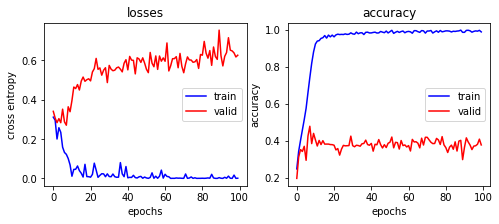

In [37]:
plt.figure(figsize=(8, 3))
ax1 = plt.subplot(121)
ax1.plot(h_epochs, h_train_losses_0, 'b', h_epochs, h_valid_losses_0, 'r')
ax1.set_title('losses')
ax1.set_ylabel('cross entropy')
ax1.set_xlabel('epochs')
ax1.legend(['train', 'valid'])
ax1 = plt.subplot(122)
ax1.plot(h_epochs, h_train_acc_0, 'b', h_epochs, h_valid_acc_0, 'r')
ax1.set_title('accuracy')
ax1.set_ylabel('accuracy')
ax1.set_xlabel('epochs')
ax1.legend(['train', 'valid'])
plt.show()

# Pix2Pix Check